# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

# Set up some global variables
USE_GPU = True

if USE_GPU:
    device = '/device:GPU:0'
else:
    device = '/cpu:0'

# Constant to control how often we print when training models
print_every = 100

print('Using device: ', device)

Using device:  /device:GPU:0


## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

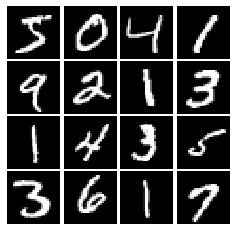

In [96]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [97]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    pass
    #N, H = x.shape # Shape of (batch, 784)
    return tf.maximum(x, alpha * x)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [98]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [131]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    pass
    return  tf.random.uniform((batch_size, dim),-1,1) # The default range is [0,1],so we must set range as [-1,1]

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [132]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [133]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer((784,)),
        tf.keras.layers.Dense(256, activation=leaky_relu),
        tf.keras.layers.Dense(256, activation=leaky_relu),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [134]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [135]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        #pass
        tf.keras.layers.InputLayer((noise_dim,)),
        tf.keras.layers.Dense(1024,activation='relu'),
        #tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024,activation='relu'),
        tf.keras.layers.Dense(784,activation=tf.nn.tanh)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [136]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [137]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    pass
    D_real = tf.ones_like(logits_real)
    D_fake = tf.zeros_like(logits_fake)
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    #loss = cross_entropy(D_real,logits_real) + cross_entropy(D_fake,logits_fake)
    loss = cross_entropy(D_real,logits_real) + cross_entropy(D_fake,logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    pass
    G_fake = tf.ones_like(logits_fake)
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True) #We must set flag FROM_LOGITS to TRUE
    loss = cross_entropy(G_fake,logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [138]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [139]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])
#print(answers['logits_fake'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [140]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    pass
    D_solver = tf.optimizers.Adam(learning_rate, beta1)
    G_solver = tf.optimizers.Adam(learning_rate, beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [141]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    with tf.device(device):
        for epoch in range(num_epochs):
            for (x, _) in mnist:
                with tf.GradientTape() as tape:
                    real_data = x
                    logits_real = D(preprocess_img(real_data))

                    g_fake_seed = sample_noise(batch_size, noise_size)
                    fake_images = G(g_fake_seed)
                    logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                    d_total_error = discriminator_loss(logits_real, logits_fake)
                    d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                    D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))

                with tf.GradientTape() as tape:
                    g_fake_seed = sample_noise(batch_size, noise_size)
                    fake_images = G(g_fake_seed)

                    gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                    g_error = generator_loss(gen_logits_fake)
                    g_gradients = tape.gradient(g_error, G.trainable_variables)      
                    G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

                if (iter_count % show_every == 0):
                    print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                    imgs_numpy = fake_images.cpu().numpy()
                    show_images(imgs_numpy[0:16])
                    plt.show()
                iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.119, G:0.7376


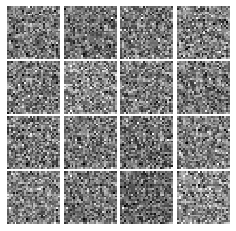

Epoch: 0, Iter: 20, D: 0.5815, G:0.9495


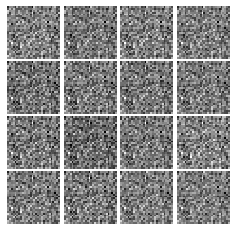

Epoch: 0, Iter: 40, D: 0.348, G:1.378


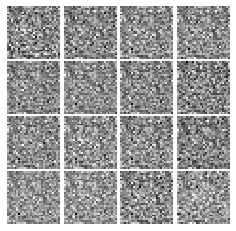

Epoch: 0, Iter: 60, D: 0.1321, G:3.281


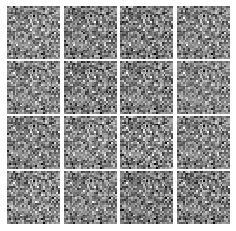

Epoch: 0, Iter: 80, D: 0.6192, G:10.6


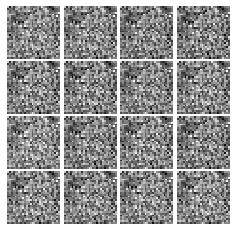

Epoch: 0, Iter: 100, D: 1.605, G:0.9243


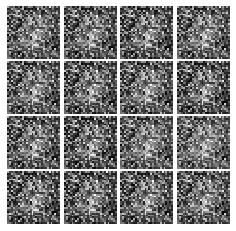

Epoch: 0, Iter: 120, D: 0.9058, G:1.989


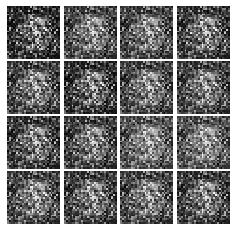

Epoch: 0, Iter: 140, D: 1.78, G:0.8533


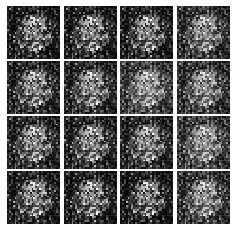

Epoch: 0, Iter: 160, D: 1.069, G:1.337


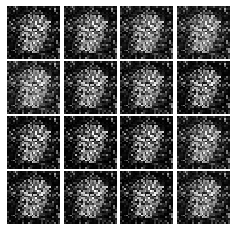

Epoch: 0, Iter: 180, D: 1.344, G:1.389


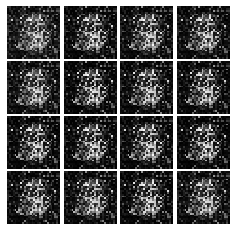

Epoch: 0, Iter: 200, D: 1.149, G:1.325


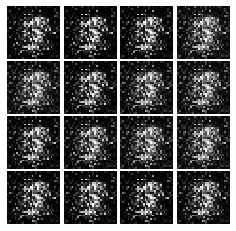

Epoch: 0, Iter: 220, D: 1.034, G:3.0


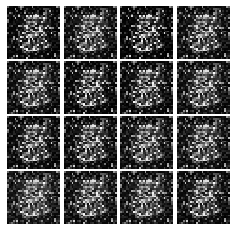

Epoch: 0, Iter: 240, D: 1.065, G:1.256


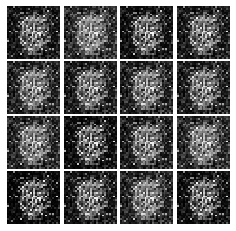

Epoch: 0, Iter: 260, D: 1.498, G:0.7145


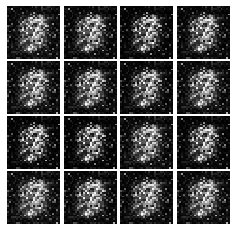

Epoch: 0, Iter: 280, D: 1.395, G:0.6894


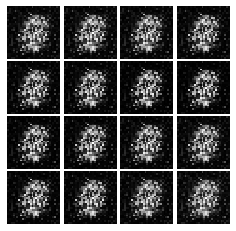

Epoch: 0, Iter: 300, D: 1.021, G:1.54


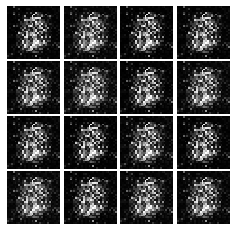

Epoch: 0, Iter: 320, D: 1.294, G:1.436


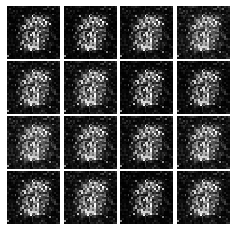

Epoch: 0, Iter: 340, D: 0.9158, G:1.442


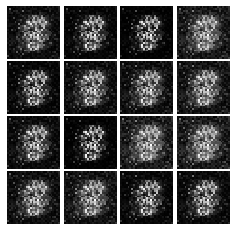

Epoch: 0, Iter: 360, D: 1.3, G:1.642


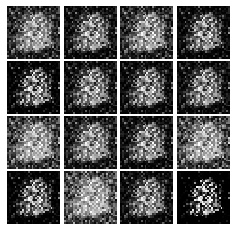

Epoch: 0, Iter: 380, D: 1.341, G:2.387


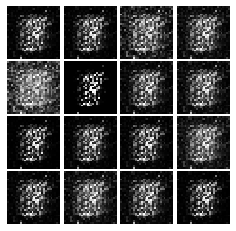

Epoch: 0, Iter: 400, D: 1.297, G:1.147


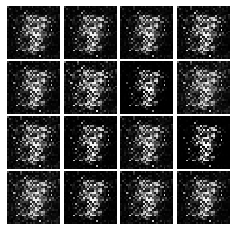

Epoch: 0, Iter: 420, D: 1.436, G:0.8435


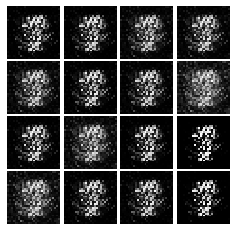

Epoch: 0, Iter: 440, D: 1.651, G:0.9109


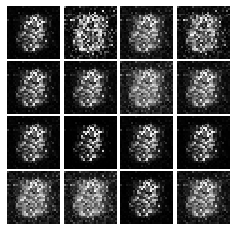

Epoch: 0, Iter: 460, D: 0.9332, G:1.608


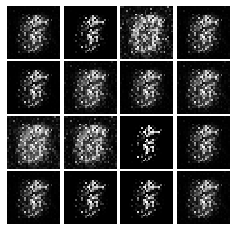

Epoch: 1, Iter: 480, D: 1.453, G:1.058


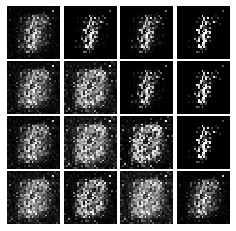

Epoch: 1, Iter: 500, D: 1.441, G:1.754


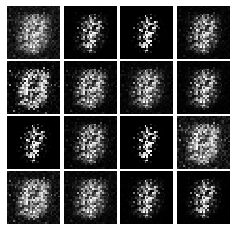

Epoch: 1, Iter: 520, D: 1.063, G:1.231


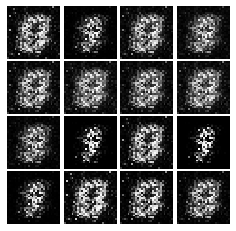

Epoch: 1, Iter: 540, D: 1.18, G:1.552


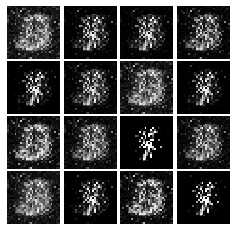

Epoch: 1, Iter: 560, D: 1.142, G:1.531


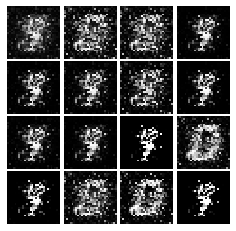

Epoch: 1, Iter: 580, D: 1.062, G:1.398


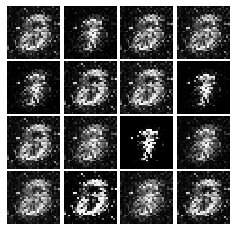

Epoch: 1, Iter: 600, D: 1.222, G:1.506


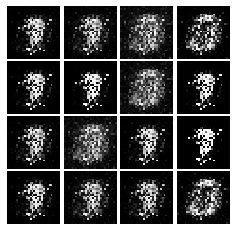

Epoch: 1, Iter: 620, D: 0.8, G:1.966


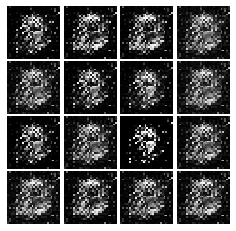

Epoch: 1, Iter: 640, D: 2.158, G:1.856


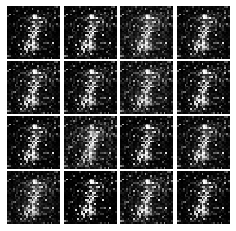

Epoch: 1, Iter: 660, D: 1.069, G:1.616


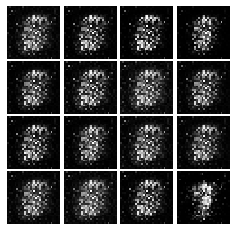

Epoch: 1, Iter: 680, D: 1.414, G:0.7553


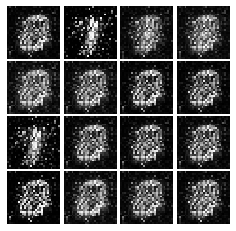

Epoch: 1, Iter: 700, D: 1.148, G:1.2


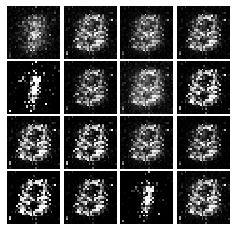

Epoch: 1, Iter: 720, D: 1.349, G:0.9628


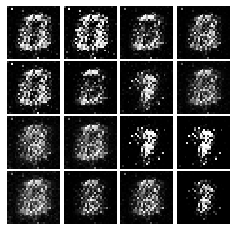

Epoch: 1, Iter: 740, D: 1.081, G:1.419


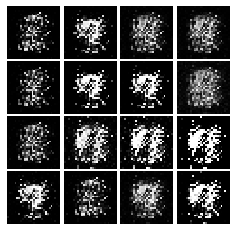

Epoch: 1, Iter: 760, D: 1.2, G:1.877


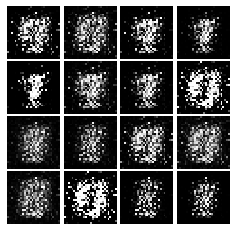

Epoch: 1, Iter: 780, D: 0.9658, G:1.317


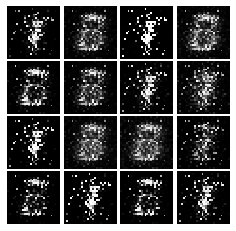

Epoch: 1, Iter: 800, D: 1.457, G:1.092


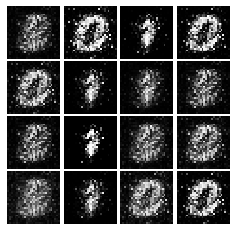

Epoch: 1, Iter: 820, D: 1.468, G:1.096


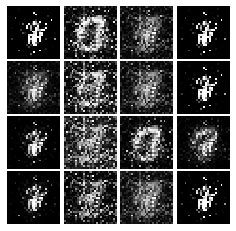

Epoch: 1, Iter: 840, D: 1.07, G:0.8624


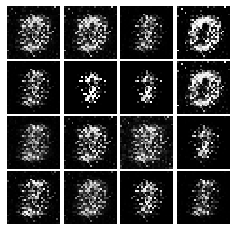

Epoch: 1, Iter: 860, D: 1.106, G:1.156


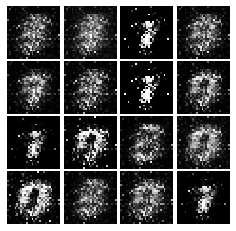

Epoch: 1, Iter: 880, D: 1.24, G:1.072


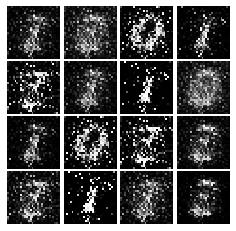

Epoch: 1, Iter: 900, D: 1.252, G:1.248


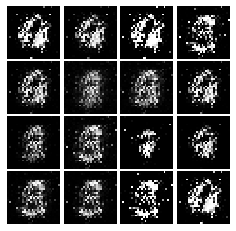

Epoch: 1, Iter: 920, D: 1.518, G:0.6019


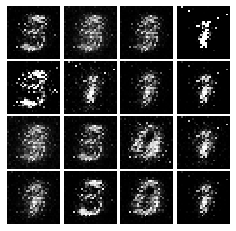

Epoch: 2, Iter: 940, D: 1.353, G:0.9799


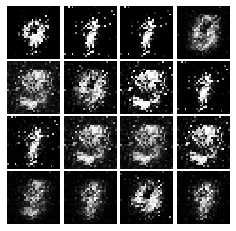

Epoch: 2, Iter: 960, D: 1.255, G:1.291


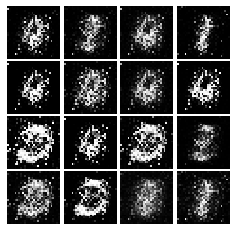

Epoch: 2, Iter: 980, D: 1.451, G:1.043


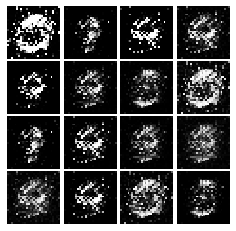

Epoch: 2, Iter: 1000, D: 1.106, G:1.062


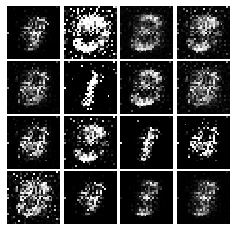

Epoch: 2, Iter: 1020, D: 1.23, G:1.09


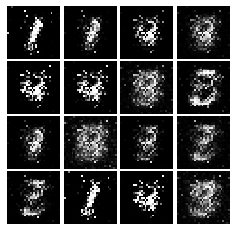

Epoch: 2, Iter: 1040, D: 1.219, G:0.9366


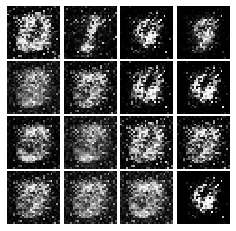

Epoch: 2, Iter: 1060, D: 1.477, G:0.9288


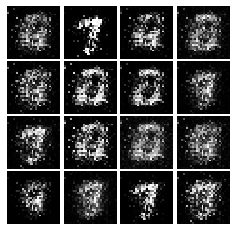

Epoch: 2, Iter: 1080, D: 1.228, G:0.8387


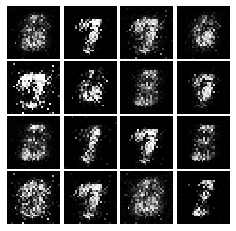

Epoch: 2, Iter: 1100, D: 1.254, G:0.809


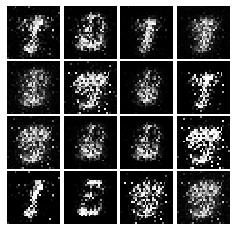

Epoch: 2, Iter: 1120, D: 1.283, G:0.7642


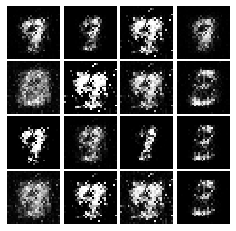

Epoch: 2, Iter: 1140, D: 1.128, G:1.156


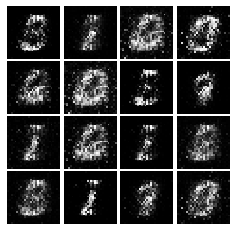

Epoch: 2, Iter: 1160, D: 1.227, G:1.011


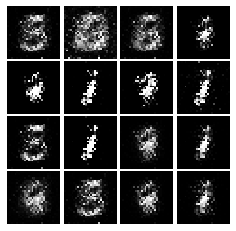

Epoch: 2, Iter: 1180, D: 1.239, G:1.15


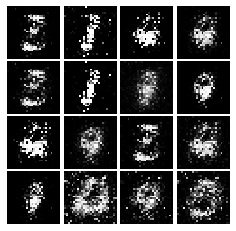

Epoch: 2, Iter: 1200, D: 1.079, G:1.801


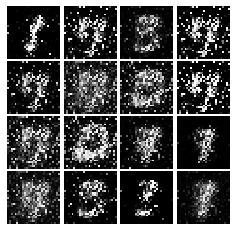

Epoch: 2, Iter: 1220, D: 1.187, G:1.62


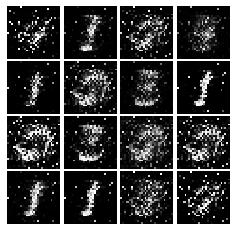

Epoch: 2, Iter: 1240, D: 1.208, G:1.131


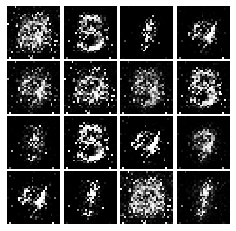

Epoch: 2, Iter: 1260, D: 1.121, G:0.9733


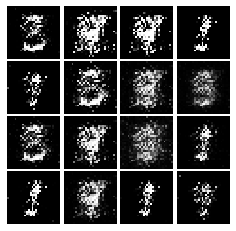

Epoch: 2, Iter: 1280, D: 1.147, G:1.091


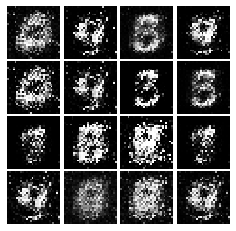

Epoch: 2, Iter: 1300, D: 1.591, G:1.59


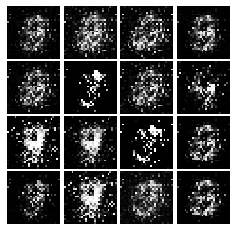

Epoch: 2, Iter: 1320, D: 1.103, G:1.359


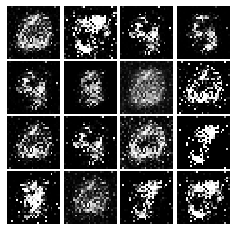

Epoch: 2, Iter: 1340, D: 1.916, G:0.3604


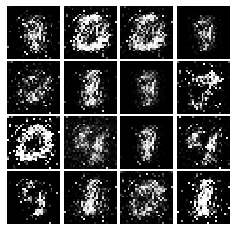

Epoch: 2, Iter: 1360, D: 1.391, G:1.835


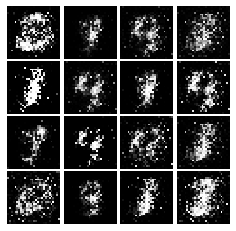

Epoch: 2, Iter: 1380, D: 1.369, G:0.9028


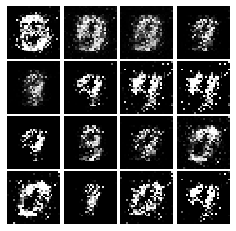

Epoch: 2, Iter: 1400, D: 1.04, G:1.196


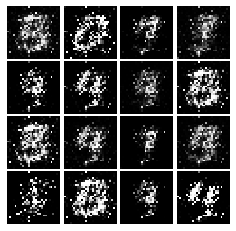

Epoch: 3, Iter: 1420, D: 1.431, G:1.572


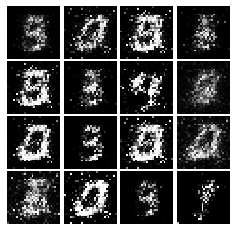

Epoch: 3, Iter: 1440, D: 1.28, G:1.073


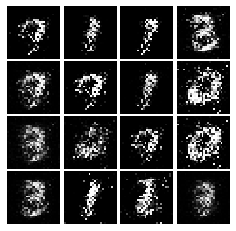

Epoch: 3, Iter: 1460, D: 1.01, G:2.283


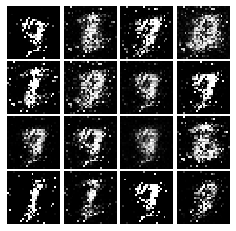

Epoch: 3, Iter: 1480, D: 1.498, G:1.345


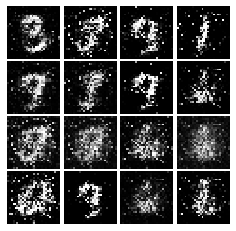

Epoch: 3, Iter: 1500, D: 1.154, G:1.069


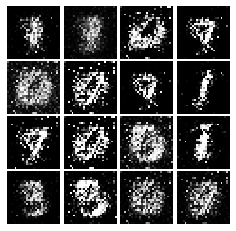

Epoch: 3, Iter: 1520, D: 1.499, G:0.8264


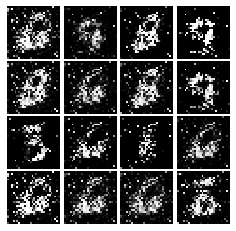

Epoch: 3, Iter: 1540, D: 1.116, G:1.041


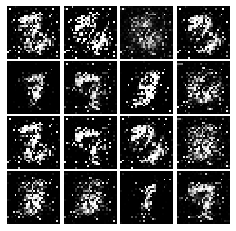

Epoch: 3, Iter: 1560, D: 1.139, G:1.099


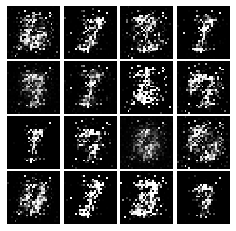

Epoch: 3, Iter: 1580, D: 1.135, G:1.654


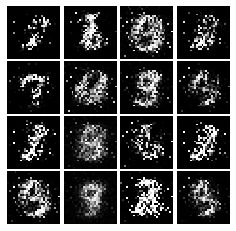

Epoch: 3, Iter: 1600, D: 1.581, G:0.7964


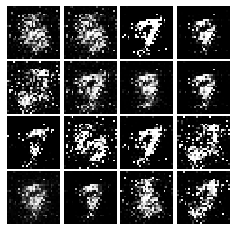

Epoch: 3, Iter: 1620, D: 1.219, G:1.034


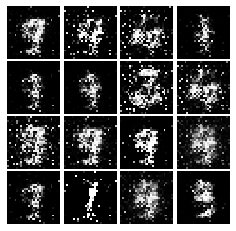

Epoch: 3, Iter: 1640, D: 1.156, G:0.9659


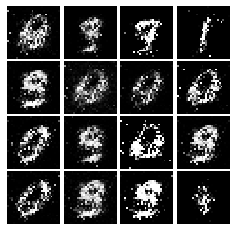

Epoch: 3, Iter: 1660, D: 1.039, G:1.136


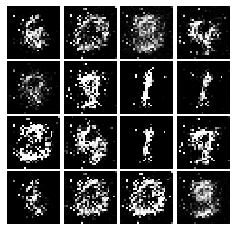

Epoch: 3, Iter: 1680, D: 1.187, G:1.238


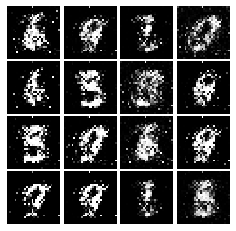

Epoch: 3, Iter: 1700, D: 1.318, G:0.972


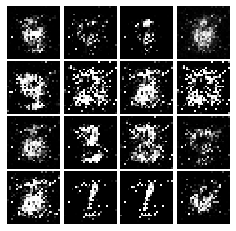

Epoch: 3, Iter: 1720, D: 1.108, G:1.495


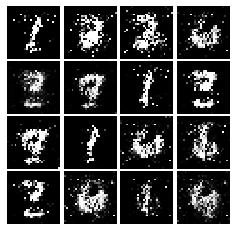

Epoch: 3, Iter: 1740, D: 1.128, G:1.446


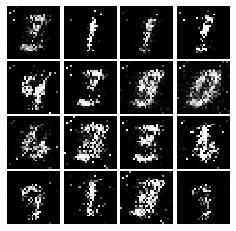

Epoch: 3, Iter: 1760, D: 1.567, G:3.935


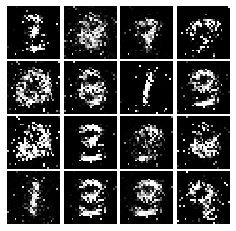

Epoch: 3, Iter: 1780, D: 1.17, G:1.232


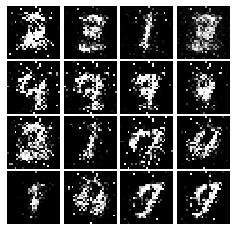

Epoch: 3, Iter: 1800, D: 1.185, G:1.441


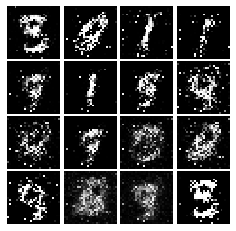

Epoch: 3, Iter: 1820, D: 1.158, G:1.314


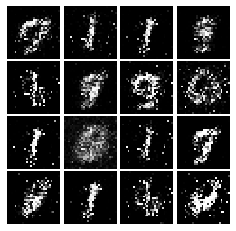

Epoch: 3, Iter: 1840, D: 2.477, G:3.191


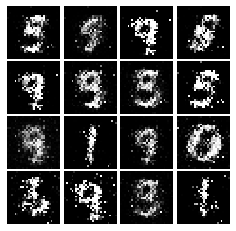

Epoch: 3, Iter: 1860, D: 1.338, G:1.002


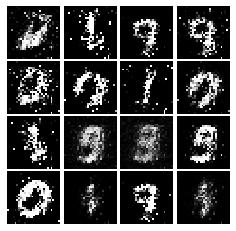

Epoch: 4, Iter: 1880, D: 1.431, G:0.9193


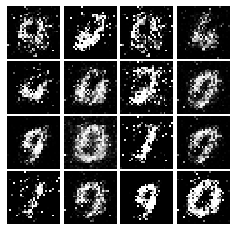

Epoch: 4, Iter: 1900, D: 1.337, G:1.604


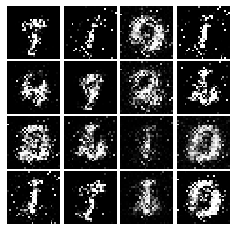

Epoch: 4, Iter: 1920, D: 1.215, G:1.023


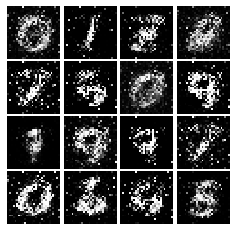

Epoch: 4, Iter: 1940, D: 1.332, G:1.035


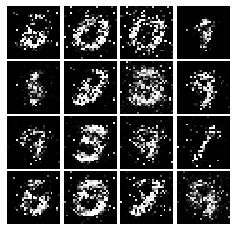

Epoch: 4, Iter: 1960, D: 1.251, G:1.246


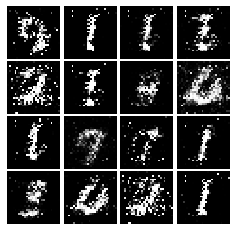

Epoch: 4, Iter: 1980, D: 1.297, G:0.8748


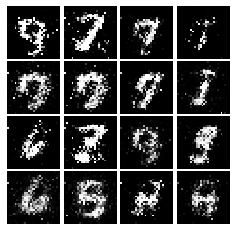

Epoch: 4, Iter: 2000, D: 1.457, G:0.8086


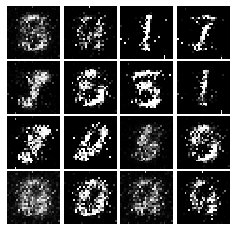

Epoch: 4, Iter: 2020, D: 1.386, G:0.8301


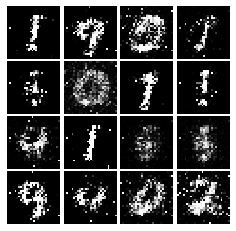

Epoch: 4, Iter: 2040, D: 1.342, G:0.8427


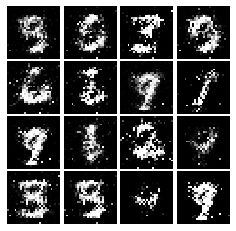

Epoch: 4, Iter: 2060, D: 1.286, G:0.8494


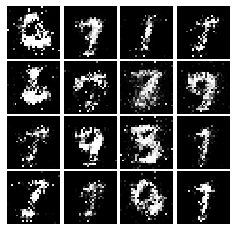

Epoch: 4, Iter: 2080, D: 1.322, G:0.9405


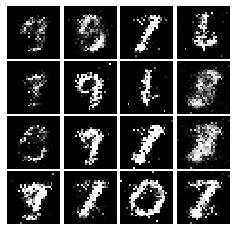

Epoch: 4, Iter: 2100, D: 1.355, G:0.7915


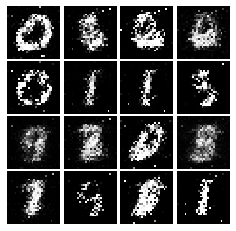

Epoch: 4, Iter: 2120, D: 1.365, G:1.016


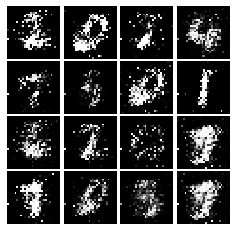

Epoch: 4, Iter: 2140, D: 1.199, G:0.8359


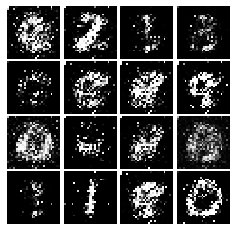

Epoch: 4, Iter: 2160, D: 1.44, G:0.938


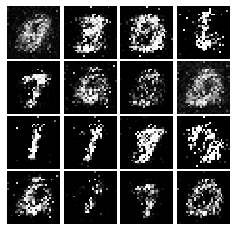

Epoch: 4, Iter: 2180, D: 1.242, G:0.8418


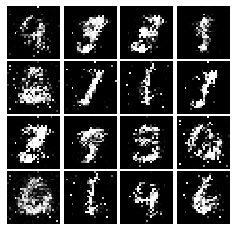

Epoch: 4, Iter: 2200, D: 1.312, G:0.805


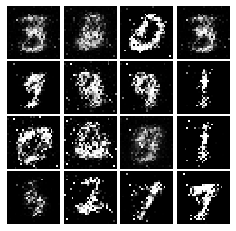

Epoch: 4, Iter: 2220, D: 1.263, G:0.9253


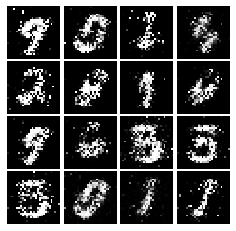

Epoch: 4, Iter: 2240, D: 1.246, G:1.048


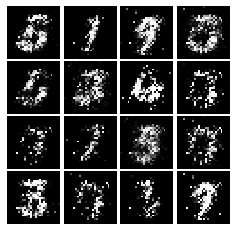

Epoch: 4, Iter: 2260, D: 1.11, G:1.311


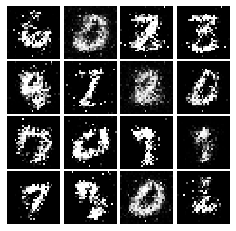

Epoch: 4, Iter: 2280, D: 1.317, G:0.8201


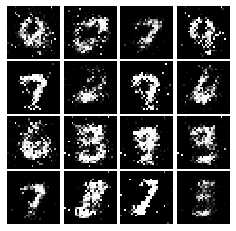

Epoch: 4, Iter: 2300, D: 1.224, G:0.8915


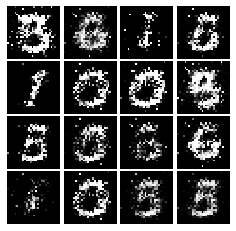

Epoch: 4, Iter: 2320, D: 1.122, G:1.115


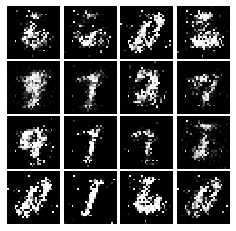

Epoch: 4, Iter: 2340, D: 1.09, G:1.165


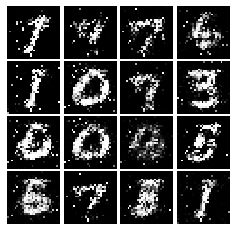

Epoch: 5, Iter: 2360, D: 1.275, G:0.9516


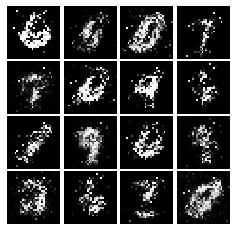

Epoch: 5, Iter: 2380, D: 1.281, G:0.8747


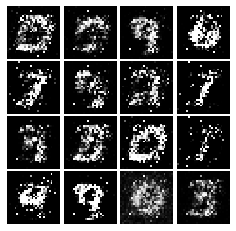

Epoch: 5, Iter: 2400, D: 1.38, G:0.9574


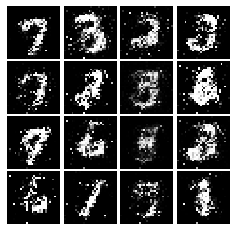

Epoch: 5, Iter: 2420, D: 1.342, G:0.9749


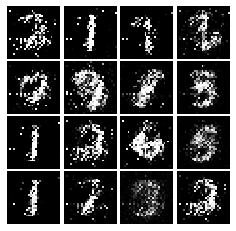

Epoch: 5, Iter: 2440, D: 1.218, G:1.008


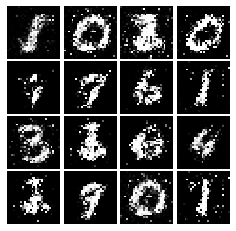

Epoch: 5, Iter: 2460, D: 1.284, G:0.9769


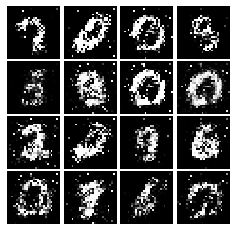

Epoch: 5, Iter: 2480, D: 1.242, G:1.183


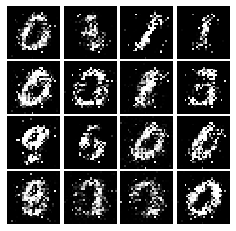

Epoch: 5, Iter: 2500, D: 1.184, G:0.9519


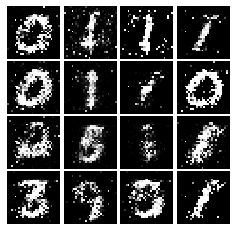

Epoch: 5, Iter: 2520, D: 1.641, G:1.144


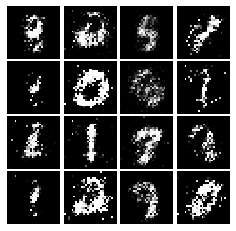

Epoch: 5, Iter: 2540, D: 1.322, G:0.7938


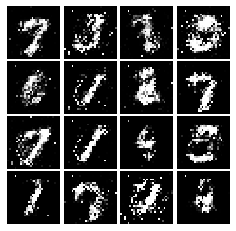

Epoch: 5, Iter: 2560, D: 1.314, G:0.7589


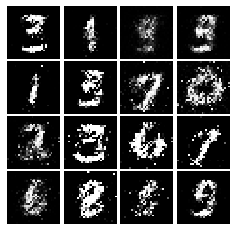

Epoch: 5, Iter: 2580, D: 1.257, G:0.9117


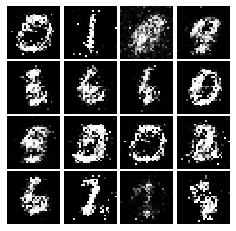

Epoch: 5, Iter: 2600, D: 1.339, G:0.9768


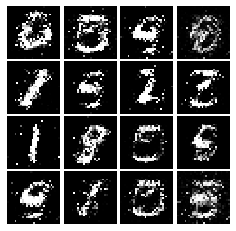

Epoch: 5, Iter: 2620, D: 1.322, G:0.9326


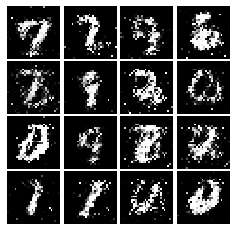

Epoch: 5, Iter: 2640, D: 1.294, G:0.9207


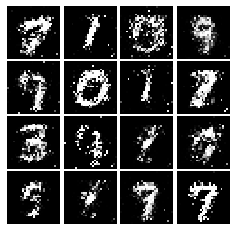

Epoch: 5, Iter: 2660, D: 1.273, G:0.9067


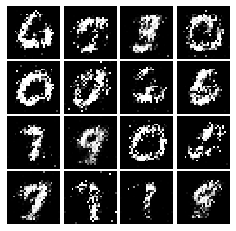

Epoch: 5, Iter: 2680, D: 1.382, G:0.8634


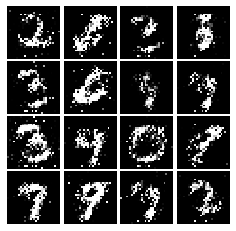

Epoch: 5, Iter: 2700, D: 1.324, G:0.8583


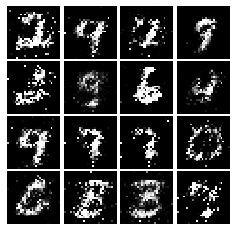

Epoch: 5, Iter: 2720, D: 1.303, G:0.9762


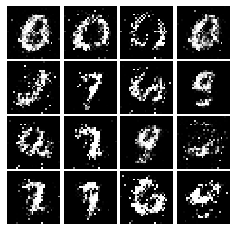

Epoch: 5, Iter: 2740, D: 1.371, G:0.8739


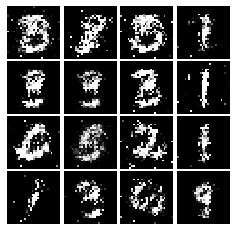

Epoch: 5, Iter: 2760, D: 1.391, G:0.8599


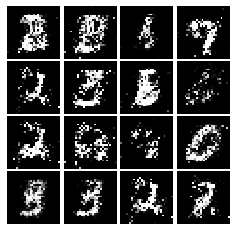

Epoch: 5, Iter: 2780, D: 1.221, G:0.8438


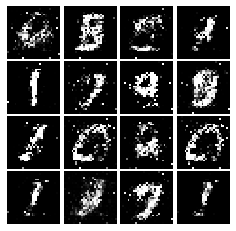

Epoch: 5, Iter: 2800, D: 1.277, G:0.8784


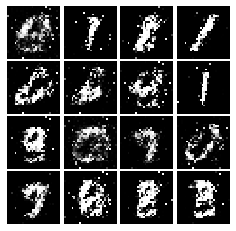

Epoch: 6, Iter: 2820, D: 1.233, G:0.9162


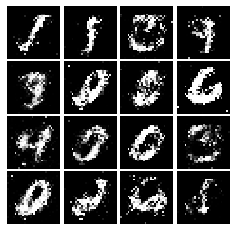

Epoch: 6, Iter: 2840, D: 1.291, G:0.8891


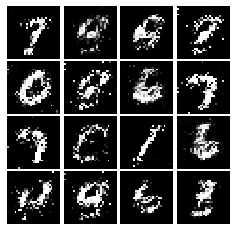

Epoch: 6, Iter: 2860, D: 1.161, G:0.6336


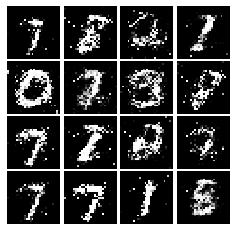

Epoch: 6, Iter: 2880, D: 1.289, G:1.149


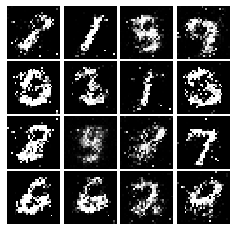

Epoch: 6, Iter: 2900, D: 1.528, G:0.9714


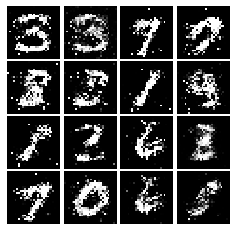

Epoch: 6, Iter: 2920, D: 1.276, G:0.9666


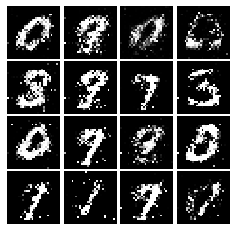

Epoch: 6, Iter: 2940, D: 1.269, G:0.8546


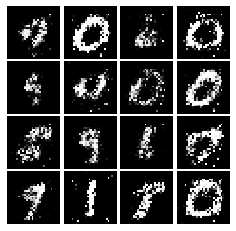

Epoch: 6, Iter: 2960, D: 1.278, G:0.9511


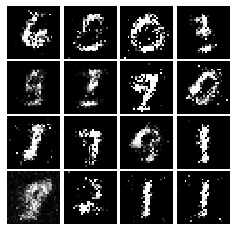

Epoch: 6, Iter: 2980, D: 1.378, G:0.8361


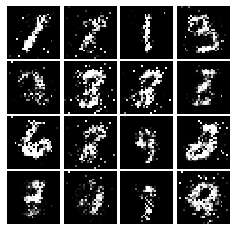

Epoch: 6, Iter: 3000, D: 1.284, G:0.8574


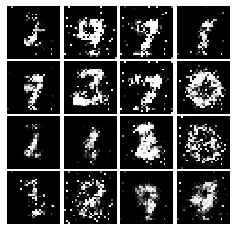

Epoch: 6, Iter: 3020, D: 1.34, G:0.8095


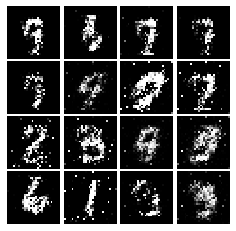

Epoch: 6, Iter: 3040, D: 1.317, G:0.8025


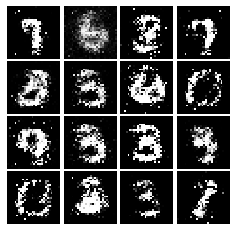

Epoch: 6, Iter: 3060, D: 1.247, G:0.827


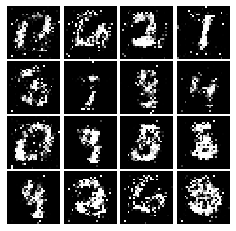

Epoch: 6, Iter: 3080, D: 1.375, G:0.7707


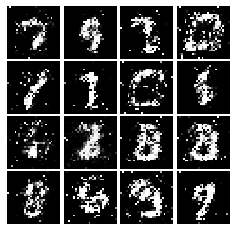

Epoch: 6, Iter: 3100, D: 1.295, G:1.003


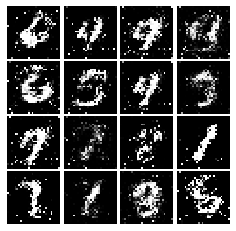

Epoch: 6, Iter: 3120, D: 1.197, G:0.9921


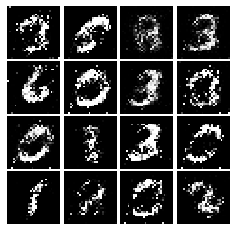

Epoch: 6, Iter: 3140, D: 1.348, G:0.7558


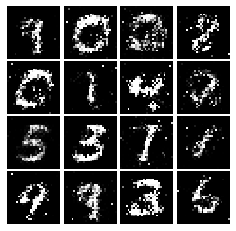

Epoch: 6, Iter: 3160, D: 1.392, G:0.8621


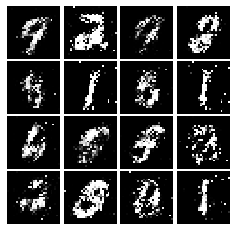

Epoch: 6, Iter: 3180, D: 1.308, G:0.9155


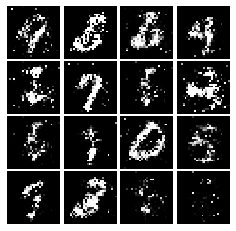

Epoch: 6, Iter: 3200, D: 1.217, G:1.084


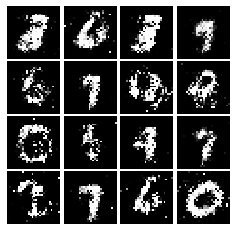

Epoch: 6, Iter: 3220, D: 1.311, G:0.8067


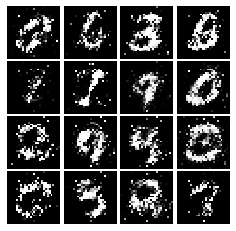

Epoch: 6, Iter: 3240, D: 1.276, G:0.9673


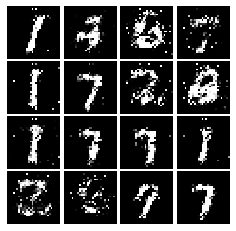

Epoch: 6, Iter: 3260, D: 1.402, G:0.7787


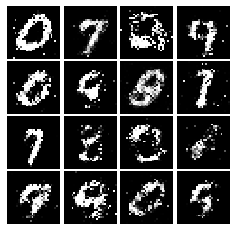

Epoch: 6, Iter: 3280, D: 1.417, G:0.7067


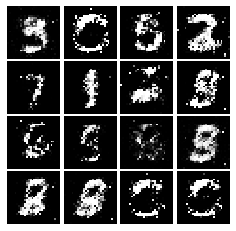

Epoch: 7, Iter: 3300, D: 1.286, G:0.8099


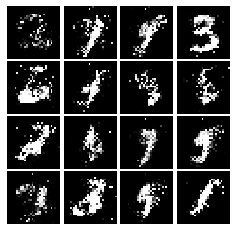

Epoch: 7, Iter: 3320, D: 1.258, G:0.9037


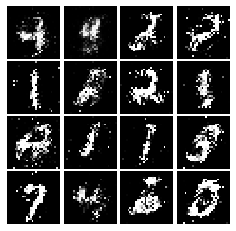

Epoch: 7, Iter: 3340, D: 1.245, G:1.051


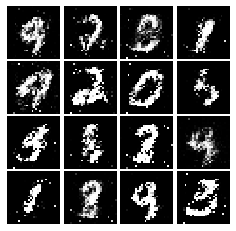

Epoch: 7, Iter: 3360, D: 1.394, G:0.792


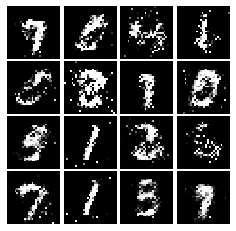

Epoch: 7, Iter: 3380, D: 1.324, G:0.834


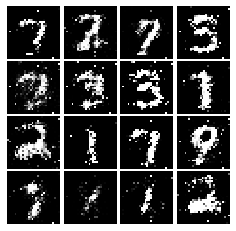

Epoch: 7, Iter: 3400, D: 1.379, G:0.6722


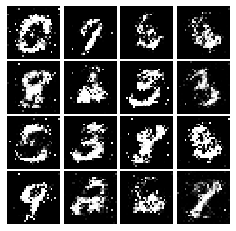

Epoch: 7, Iter: 3420, D: 1.291, G:0.8874


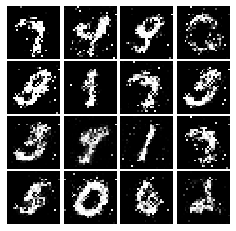

Epoch: 7, Iter: 3440, D: 1.326, G:0.9062


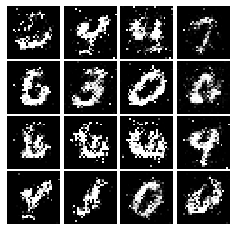

Epoch: 7, Iter: 3460, D: 1.25, G:0.8815


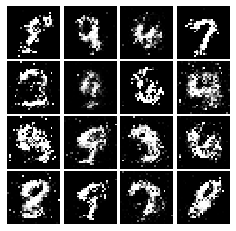

Epoch: 7, Iter: 3480, D: 1.35, G:0.8736


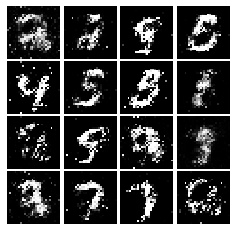

Epoch: 7, Iter: 3500, D: 1.37, G:0.8043


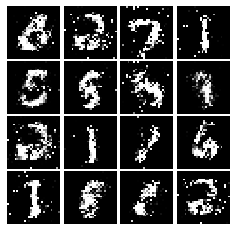

Epoch: 7, Iter: 3520, D: 1.376, G:0.859


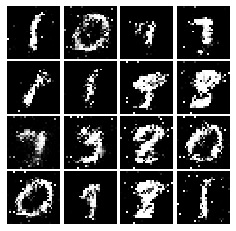

Epoch: 7, Iter: 3540, D: 1.258, G:0.8201


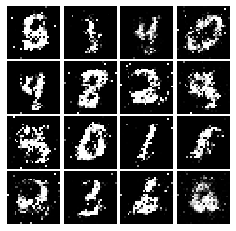

Epoch: 7, Iter: 3560, D: 1.327, G:0.8872


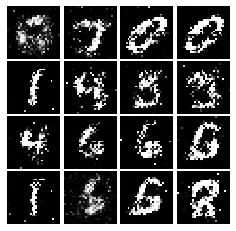

Epoch: 7, Iter: 3580, D: 1.313, G:0.7847


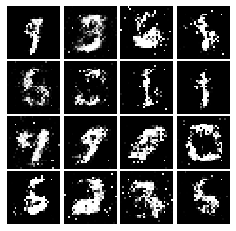

Epoch: 7, Iter: 3600, D: 1.346, G:0.8225


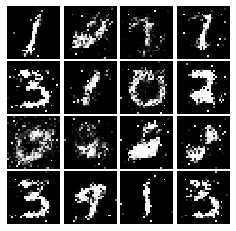

Epoch: 7, Iter: 3620, D: 1.362, G:0.7477


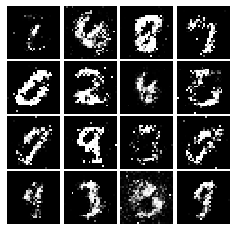

Epoch: 7, Iter: 3640, D: 1.452, G:0.8233


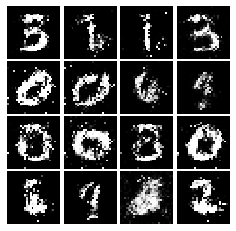

Epoch: 7, Iter: 3660, D: 1.408, G:0.8046


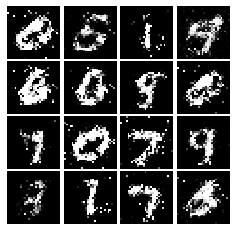

Epoch: 7, Iter: 3680, D: 1.336, G:0.8502


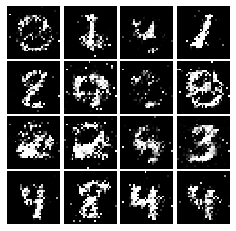

Epoch: 7, Iter: 3700, D: 1.315, G:0.7855


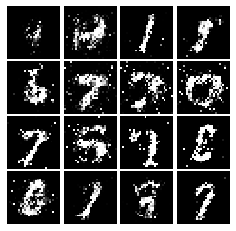

Epoch: 7, Iter: 3720, D: 1.322, G:0.7851


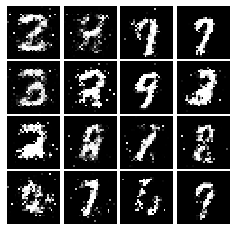

Epoch: 7, Iter: 3740, D: 1.443, G:0.6243


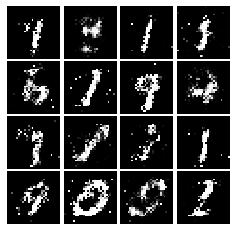

Epoch: 8, Iter: 3760, D: 1.355, G:0.8105


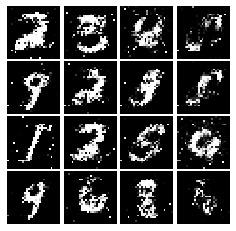

Epoch: 8, Iter: 3780, D: 1.381, G:0.7795


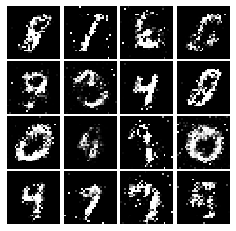

Epoch: 8, Iter: 3800, D: 1.295, G:0.7888


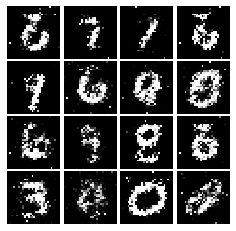

Epoch: 8, Iter: 3820, D: 1.334, G:0.8441


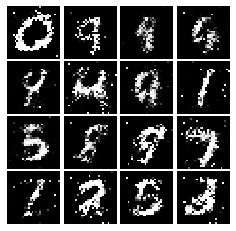

Epoch: 8, Iter: 3840, D: 1.372, G:0.7978


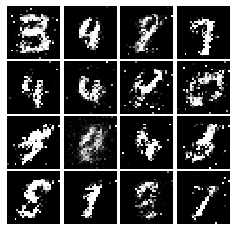

Epoch: 8, Iter: 3860, D: 1.297, G:0.7576


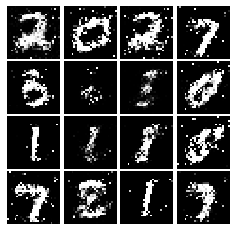

Epoch: 8, Iter: 3880, D: 1.299, G:0.802


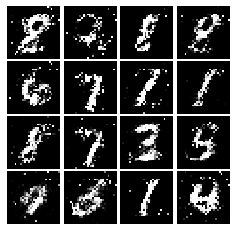

Epoch: 8, Iter: 3900, D: 1.355, G:0.7902


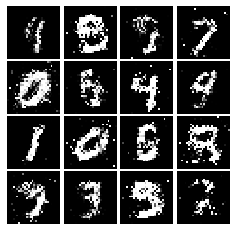

Epoch: 8, Iter: 3920, D: 1.279, G:0.7444


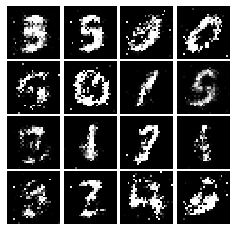

Epoch: 8, Iter: 3940, D: 1.303, G:0.7913


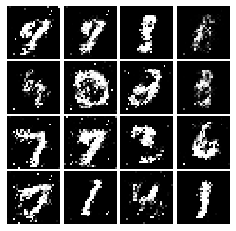

Epoch: 8, Iter: 3960, D: 1.433, G:0.7991


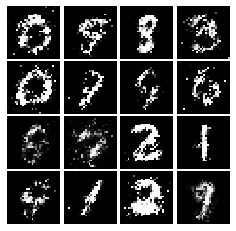

Epoch: 8, Iter: 3980, D: 1.313, G:0.7977


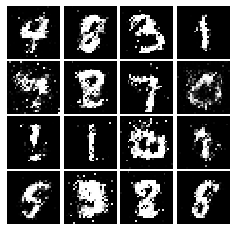

Epoch: 8, Iter: 4000, D: 1.373, G:0.9886


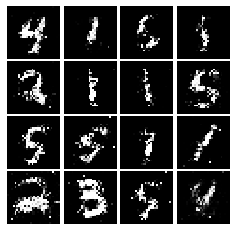

Epoch: 8, Iter: 4020, D: 1.34, G:0.8133


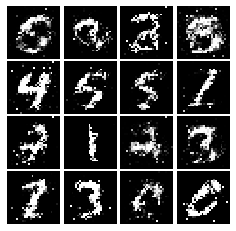

Epoch: 8, Iter: 4040, D: 1.33, G:0.8727


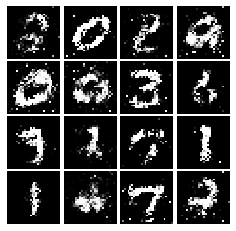

Epoch: 8, Iter: 4060, D: 1.375, G:0.7511


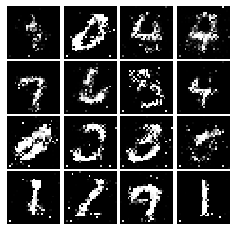

Epoch: 8, Iter: 4080, D: 1.364, G:0.7036


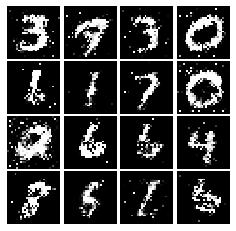

Epoch: 8, Iter: 4100, D: 1.349, G:0.7573


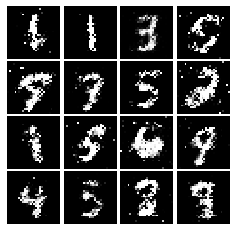

Epoch: 8, Iter: 4120, D: 1.414, G:0.7219


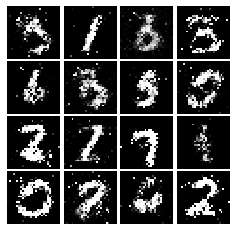

Epoch: 8, Iter: 4140, D: 1.347, G:0.7881


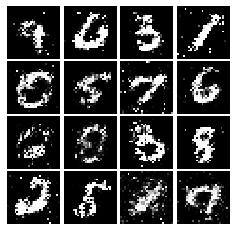

Epoch: 8, Iter: 4160, D: 1.343, G:0.8492


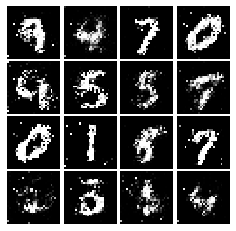

Epoch: 8, Iter: 4180, D: 1.352, G:0.7106


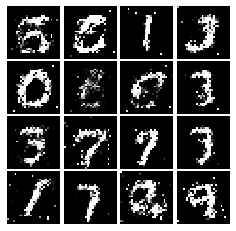

Epoch: 8, Iter: 4200, D: 1.294, G:0.7774


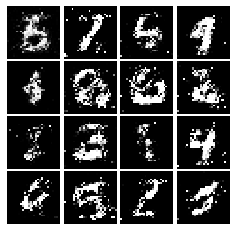

Epoch: 8, Iter: 4220, D: 1.282, G:0.7229


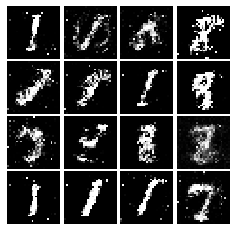

Epoch: 9, Iter: 4240, D: 1.309, G:0.7071


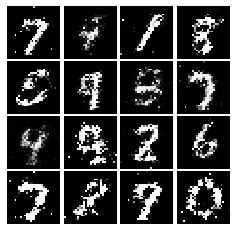

Epoch: 9, Iter: 4260, D: 1.389, G:0.6681


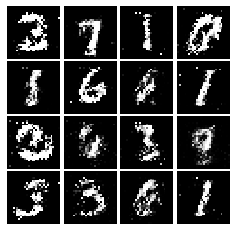

Epoch: 9, Iter: 4280, D: 1.391, G:0.7381


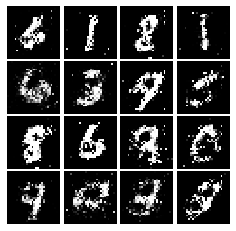

Epoch: 9, Iter: 4300, D: 1.356, G:0.7516


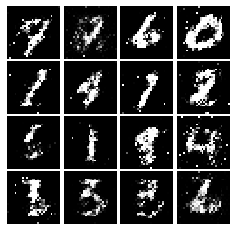

Epoch: 9, Iter: 4320, D: 1.355, G:0.8303


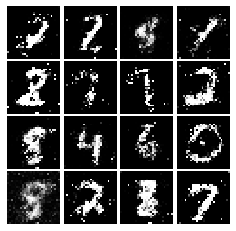

Epoch: 9, Iter: 4340, D: 1.343, G:0.8024


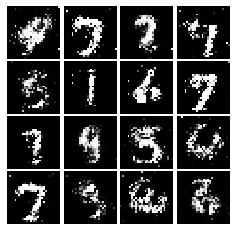

Epoch: 9, Iter: 4360, D: 1.357, G:0.9405


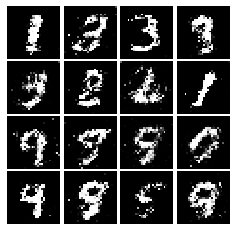

Epoch: 9, Iter: 4380, D: 1.502, G:0.7514


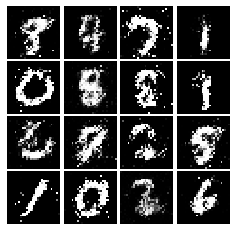

Epoch: 9, Iter: 4400, D: 1.223, G:0.8863


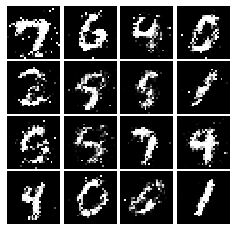

Epoch: 9, Iter: 4420, D: 1.31, G:0.854


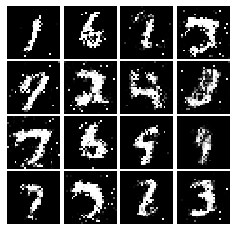

Epoch: 9, Iter: 4440, D: 1.334, G:0.7942


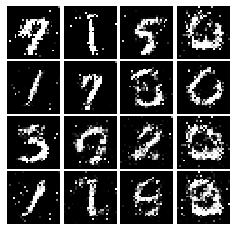

Epoch: 9, Iter: 4460, D: 1.332, G:0.8256


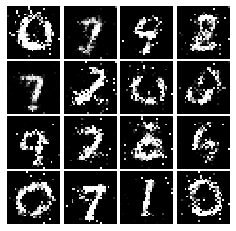

Epoch: 9, Iter: 4480, D: 1.279, G:0.7735


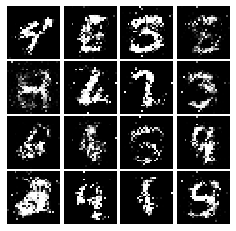

Epoch: 9, Iter: 4500, D: 1.392, G:0.7792


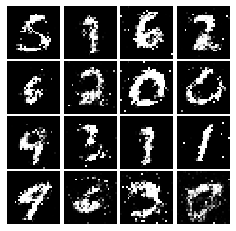

Epoch: 9, Iter: 4520, D: 1.385, G:0.7808


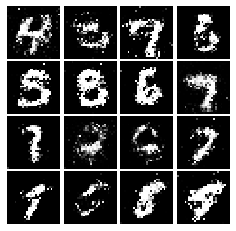

Epoch: 9, Iter: 4540, D: 1.354, G:0.7342


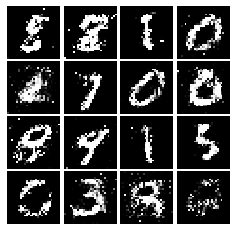

Epoch: 9, Iter: 4560, D: 1.338, G:0.7798


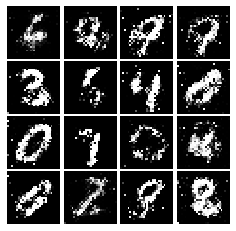

Epoch: 9, Iter: 4580, D: 1.343, G:0.8328


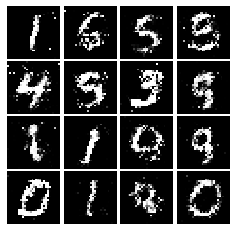

Epoch: 9, Iter: 4600, D: 1.429, G:0.7115


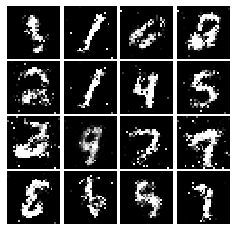

Epoch: 9, Iter: 4620, D: 1.324, G:0.7323


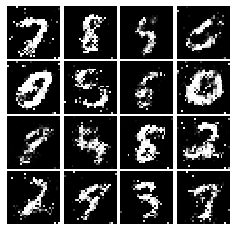

Epoch: 9, Iter: 4640, D: 1.344, G:0.8876


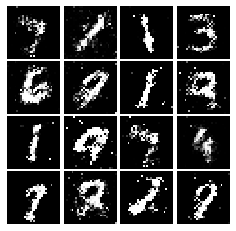

Epoch: 9, Iter: 4660, D: 1.369, G:0.7824


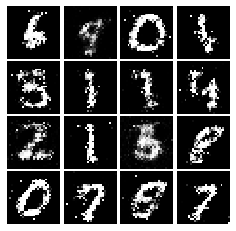

Epoch: 9, Iter: 4680, D: 1.398, G:0.7616


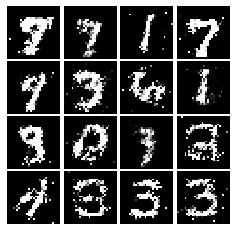

Final images


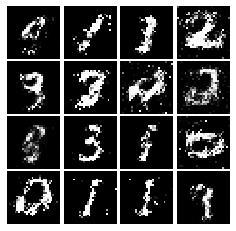

In [142]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [145]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    pass
    loss = 0.5 * tf.reduce_mean(tf.square(scores_real - 1)) + 0.5 * tf.reduce_mean(tf.square(scores_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    pass
    loss = 0.5 * tf.reduce_mean(tf.square(scores_fake - 1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [146]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.078, G:0.6465


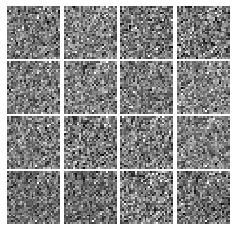

Epoch: 0, Iter: 20, D: 0.4159, G:1.577


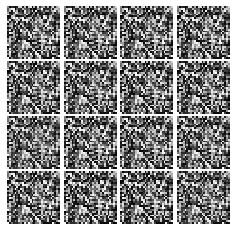

Epoch: 0, Iter: 40, D: 0.03042, G:0.6554


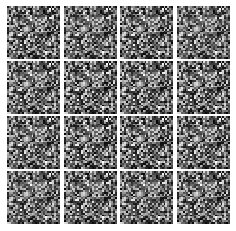

Epoch: 0, Iter: 60, D: 0.27, G:0.946


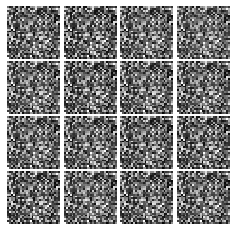

Epoch: 0, Iter: 80, D: 0.05615, G:0.499


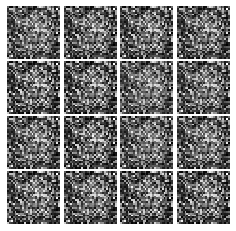

Epoch: 0, Iter: 100, D: 0.04031, G:0.7196


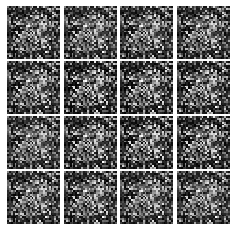

Epoch: 0, Iter: 120, D: 0.06243, G:0.8449


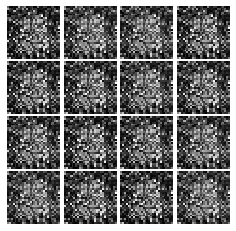

Epoch: 0, Iter: 140, D: 0.2207, G:2.271


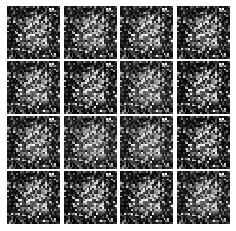

Epoch: 0, Iter: 160, D: 0.02795, G:0.7635


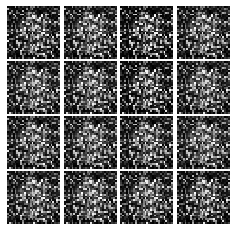

Epoch: 0, Iter: 180, D: 0.1229, G:0.7324


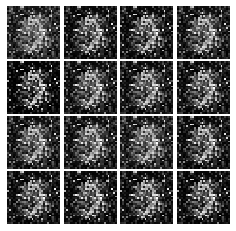

Epoch: 0, Iter: 200, D: 0.05707, G:0.398


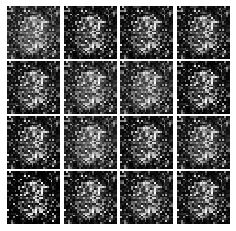

Epoch: 0, Iter: 220, D: 0.1266, G:0.5501


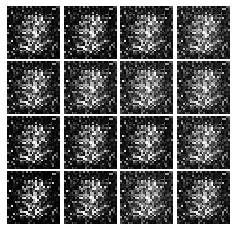

Epoch: 0, Iter: 240, D: 0.09945, G:0.5653


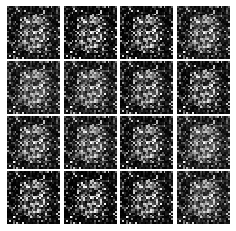

Epoch: 0, Iter: 260, D: 0.1501, G:0.4871


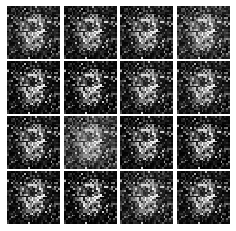

Epoch: 0, Iter: 280, D: 0.2129, G:1.01


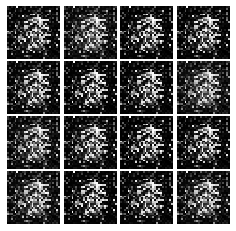

Epoch: 0, Iter: 300, D: 0.1628, G:0.3888


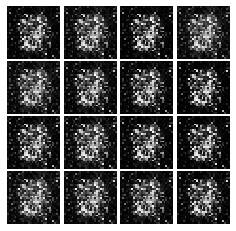

Epoch: 0, Iter: 320, D: 0.1191, G:0.404


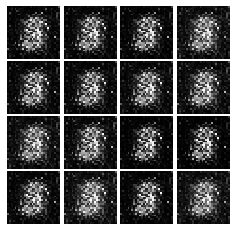

Epoch: 0, Iter: 340, D: 0.127, G:0.3071


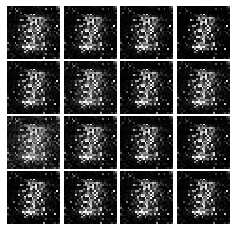

Epoch: 0, Iter: 360, D: 0.1279, G:0.4906


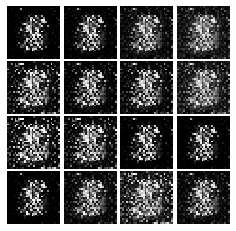

Epoch: 0, Iter: 380, D: 0.219, G:0.3801


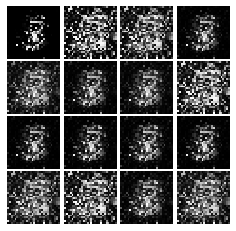

Epoch: 0, Iter: 400, D: 0.178, G:0.2985


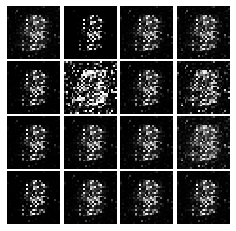

Epoch: 0, Iter: 420, D: 0.1186, G:0.3473


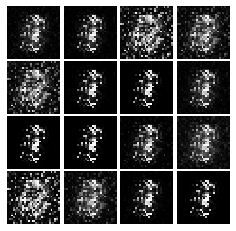

Epoch: 0, Iter: 440, D: 0.1312, G:0.6059


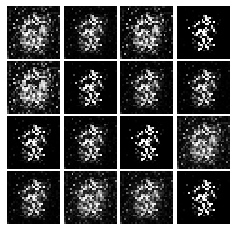

Epoch: 0, Iter: 460, D: 0.3402, G:0.01771


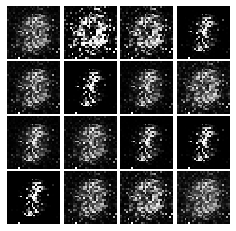

Epoch: 1, Iter: 480, D: 0.1377, G:0.3746


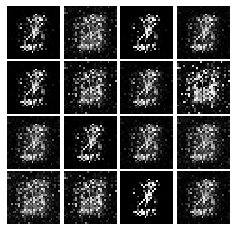

Epoch: 1, Iter: 500, D: 0.1055, G:0.3811


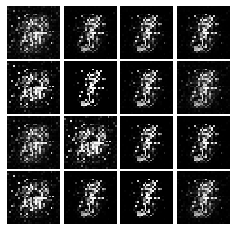

Epoch: 1, Iter: 520, D: 0.1067, G:0.3934


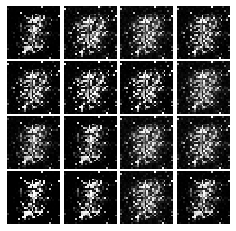

Epoch: 1, Iter: 540, D: 0.1009, G:0.7688


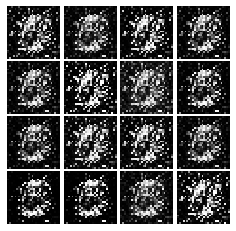

Epoch: 1, Iter: 560, D: 0.08734, G:0.3882


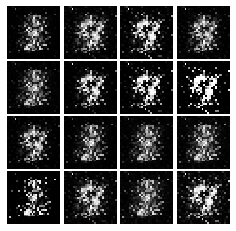

Epoch: 1, Iter: 580, D: 0.2204, G:0.1262


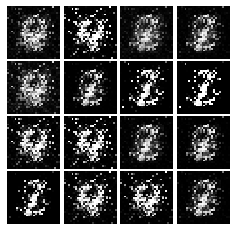

Epoch: 1, Iter: 600, D: 0.1183, G:0.3561


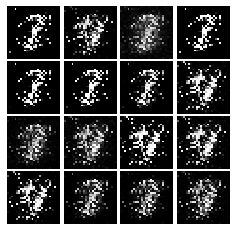

Epoch: 1, Iter: 620, D: 0.1367, G:0.6811


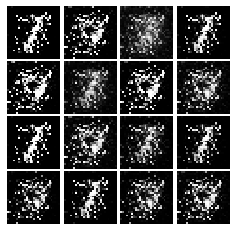

Epoch: 1, Iter: 640, D: 0.1023, G:0.5082


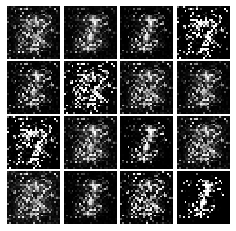

Epoch: 1, Iter: 660, D: 0.07431, G:0.4651


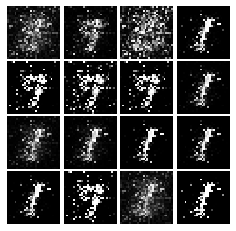

Epoch: 1, Iter: 680, D: 0.1144, G:0.4011


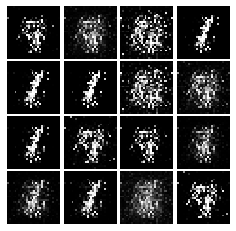

Epoch: 1, Iter: 700, D: 0.171, G:0.4201


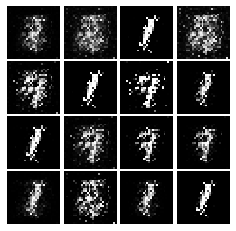

Epoch: 1, Iter: 720, D: 0.1262, G:0.3534


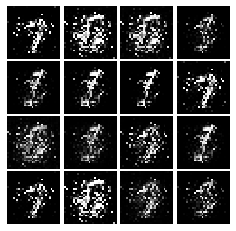

Epoch: 1, Iter: 740, D: 0.1068, G:0.4159


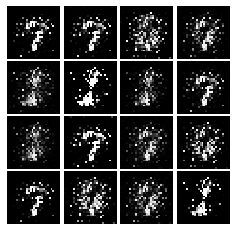

Epoch: 1, Iter: 760, D: 0.05958, G:0.5793


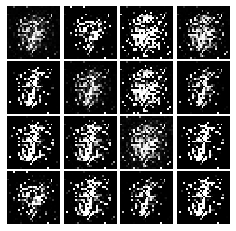

Epoch: 1, Iter: 780, D: 0.1208, G:0.3587


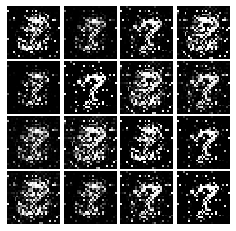

Epoch: 1, Iter: 800, D: 0.0911, G:0.3342


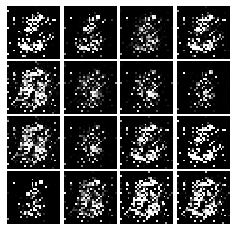

Epoch: 1, Iter: 820, D: 0.2403, G:0.1788


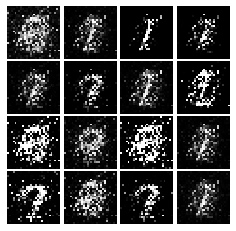

Epoch: 1, Iter: 840, D: 0.1284, G:0.5476


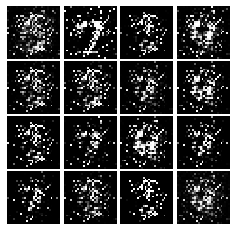

Epoch: 1, Iter: 860, D: 0.1713, G:0.4909


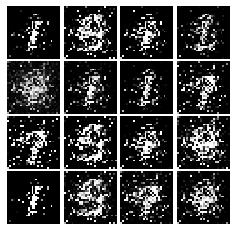

Epoch: 1, Iter: 880, D: 0.1267, G:0.3099


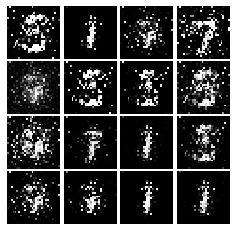

Epoch: 1, Iter: 900, D: 0.1657, G:0.1986


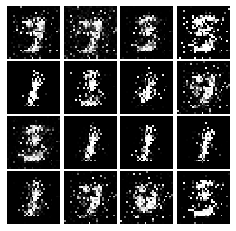

Epoch: 1, Iter: 920, D: 0.1408, G:0.294


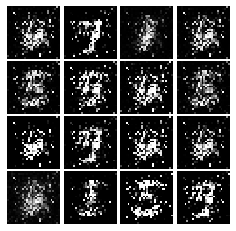

Epoch: 2, Iter: 940, D: 0.1442, G:0.3134


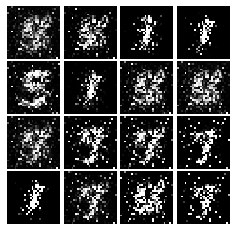

Epoch: 2, Iter: 960, D: 0.202, G:0.3509


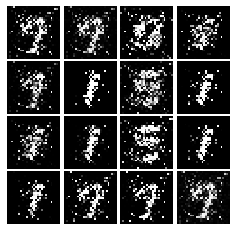

Epoch: 2, Iter: 980, D: 0.3342, G:0.5655


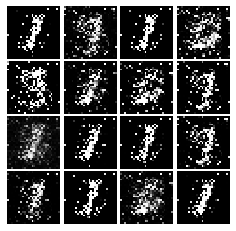

Epoch: 2, Iter: 1000, D: 0.132, G:0.3518


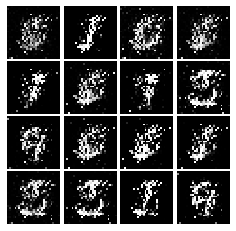

Epoch: 2, Iter: 1020, D: 0.1009, G:0.4697


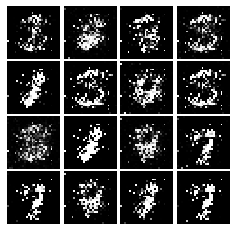

Epoch: 2, Iter: 1040, D: 0.09796, G:0.5264


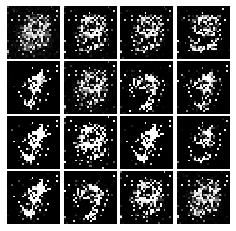

Epoch: 2, Iter: 1060, D: 0.138, G:0.5001


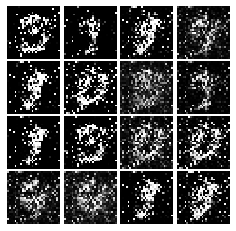

Epoch: 2, Iter: 1080, D: 0.3096, G:0.5684


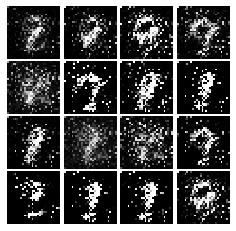

Epoch: 2, Iter: 1100, D: 0.1924, G:0.2455


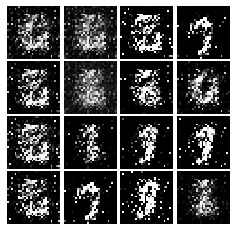

Epoch: 2, Iter: 1120, D: 0.1882, G:0.2644


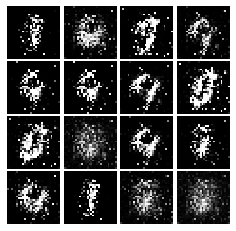

Epoch: 2, Iter: 1140, D: 0.1798, G:0.2673


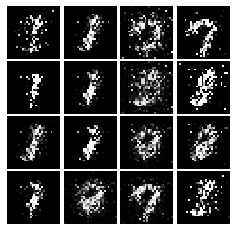

Epoch: 2, Iter: 1160, D: 0.1445, G:0.2206


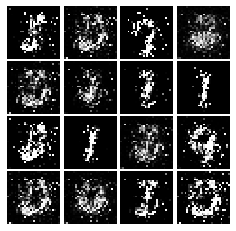

Epoch: 2, Iter: 1180, D: 0.1605, G:0.313


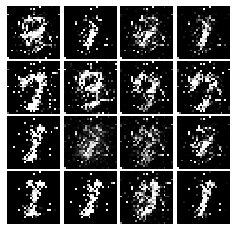

Epoch: 2, Iter: 1200, D: 0.1392, G:0.2718


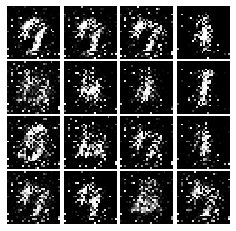

Epoch: 2, Iter: 1220, D: 0.1693, G:0.2524


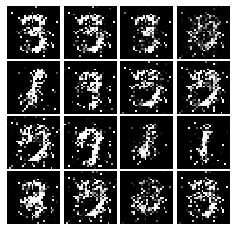

Epoch: 2, Iter: 1240, D: 0.1142, G:0.4219


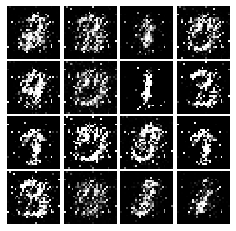

Epoch: 2, Iter: 1260, D: 0.1603, G:0.265


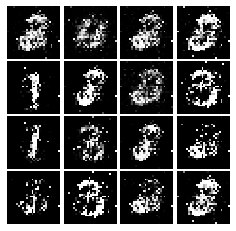

Epoch: 2, Iter: 1280, D: 0.178, G:0.2285


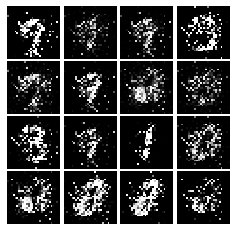

Epoch: 2, Iter: 1300, D: 0.1372, G:0.3475


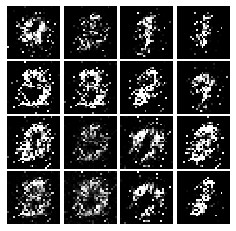

Epoch: 2, Iter: 1320, D: 0.1623, G:0.29


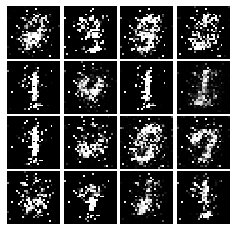

Epoch: 2, Iter: 1340, D: 0.1283, G:0.2528


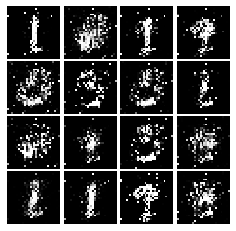

Epoch: 2, Iter: 1360, D: 0.1525, G:0.2909


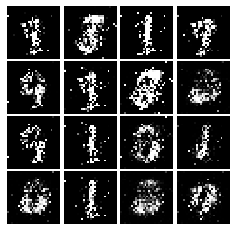

Epoch: 2, Iter: 1380, D: 0.1545, G:0.3765


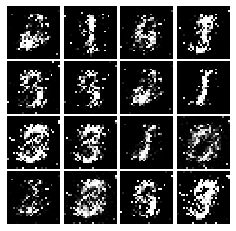

Epoch: 2, Iter: 1400, D: 0.139, G:0.3155


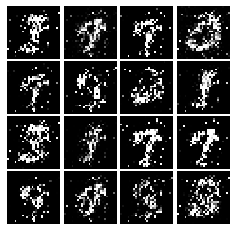

Epoch: 3, Iter: 1420, D: 0.2384, G:0.06996


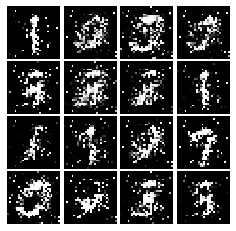

Epoch: 3, Iter: 1440, D: 0.1376, G:0.3144


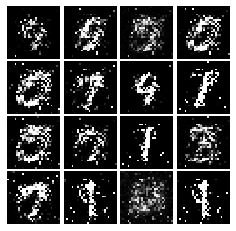

Epoch: 3, Iter: 1460, D: 0.3206, G:0.1396


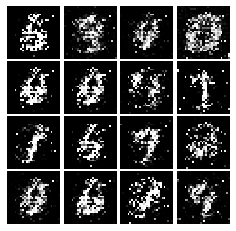

Epoch: 3, Iter: 1480, D: 0.2511, G:0.2765


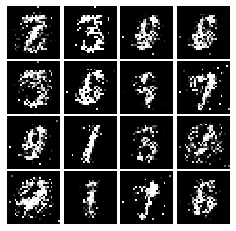

Epoch: 3, Iter: 1500, D: 0.174, G:0.2941


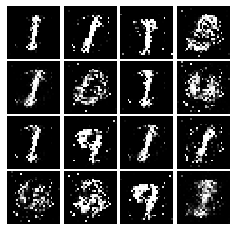

Epoch: 3, Iter: 1520, D: 0.1819, G:0.2327


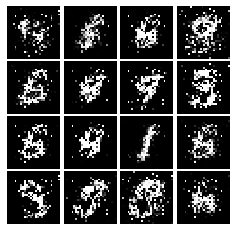

Epoch: 3, Iter: 1540, D: 0.1661, G:0.2091


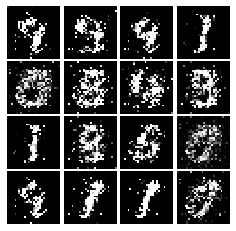

Epoch: 3, Iter: 1560, D: 0.1526, G:0.3815


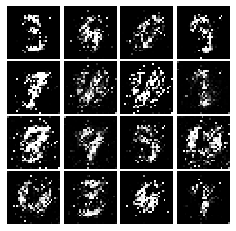

Epoch: 3, Iter: 1580, D: 0.1629, G:0.4576


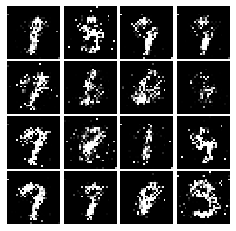

Epoch: 3, Iter: 1600, D: 0.1774, G:0.2195


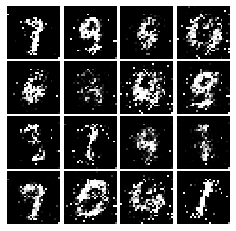

Epoch: 3, Iter: 1620, D: 0.1643, G:0.2641


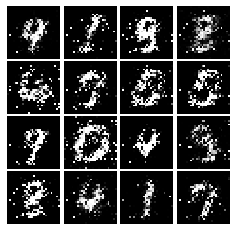

Epoch: 3, Iter: 1640, D: 0.1692, G:0.275


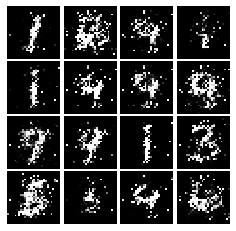

Epoch: 3, Iter: 1660, D: 0.1873, G:0.301


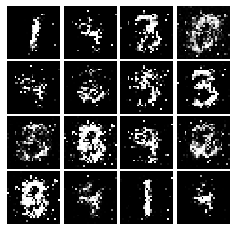

Epoch: 3, Iter: 1680, D: 0.1564, G:0.3334


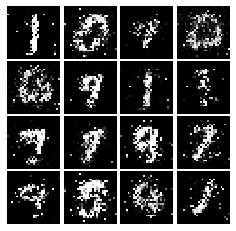

Epoch: 3, Iter: 1700, D: 0.1904, G:0.2045


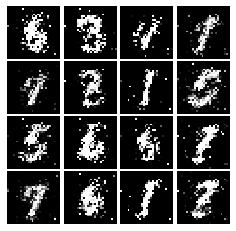

Epoch: 3, Iter: 1720, D: 0.2001, G:0.2115


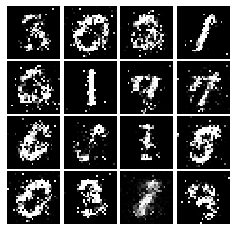

Epoch: 3, Iter: 1740, D: 0.1846, G:0.1713


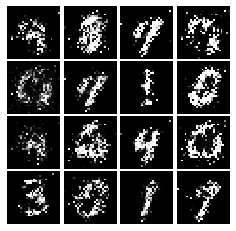

Epoch: 3, Iter: 1760, D: 0.1644, G:0.2745


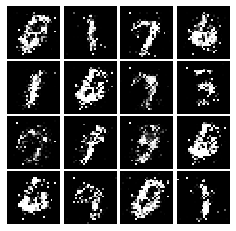

Epoch: 3, Iter: 1780, D: 0.1937, G:0.3462


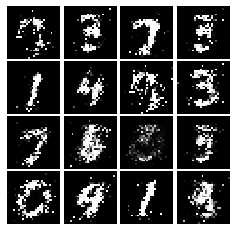

Epoch: 3, Iter: 1800, D: 0.2164, G:0.1894


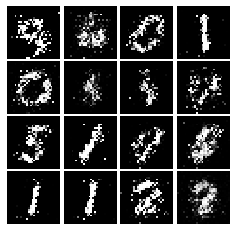

Epoch: 3, Iter: 1820, D: 0.2032, G:0.2076


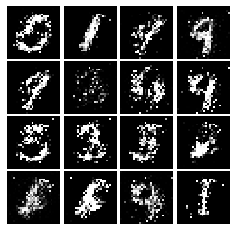

Epoch: 3, Iter: 1840, D: 0.1915, G:0.1954


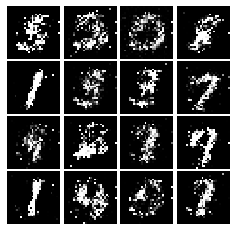

Epoch: 3, Iter: 1860, D: 0.1868, G:0.2514


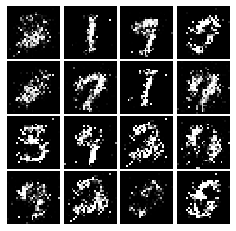

Epoch: 4, Iter: 1880, D: 0.2115, G:0.2047


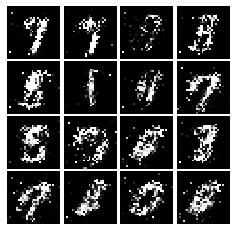

Epoch: 4, Iter: 1900, D: 0.205, G:0.2257


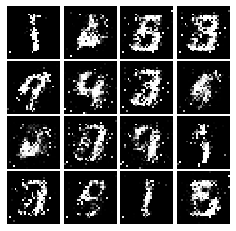

Epoch: 4, Iter: 1920, D: 0.2151, G:0.2306


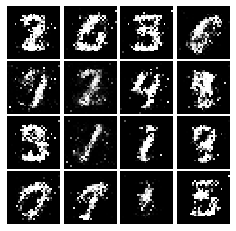

Epoch: 4, Iter: 1940, D: 0.1944, G:0.2021


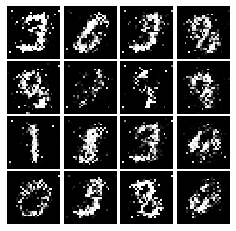

Epoch: 4, Iter: 1960, D: 0.2069, G:0.1919


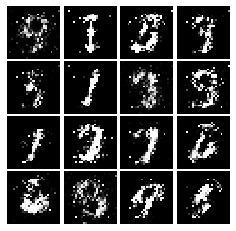

Epoch: 4, Iter: 1980, D: 0.2066, G:0.1953


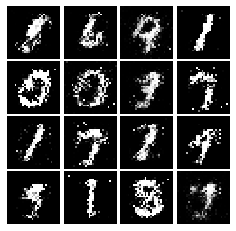

Epoch: 4, Iter: 2000, D: 0.2226, G:0.1844


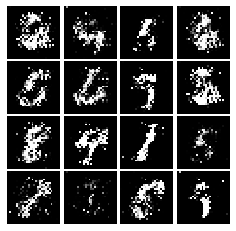

Epoch: 4, Iter: 2020, D: 0.1932, G:0.1732


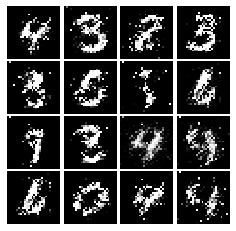

Epoch: 4, Iter: 2040, D: 0.2037, G:0.1823


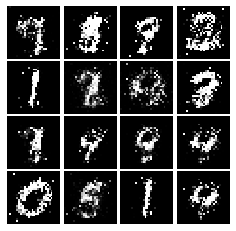

Epoch: 4, Iter: 2060, D: 0.2134, G:0.2047


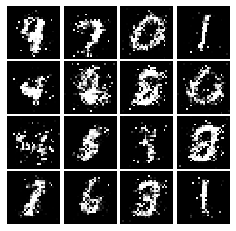

Epoch: 4, Iter: 2080, D: 0.2103, G:0.2097


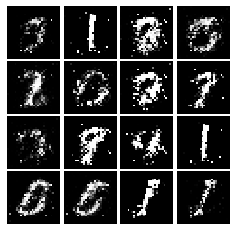

Epoch: 4, Iter: 2100, D: 0.2361, G:0.1174


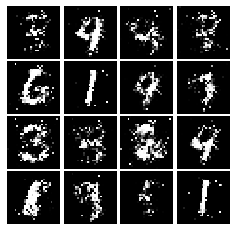

Epoch: 4, Iter: 2120, D: 0.2307, G:0.1717


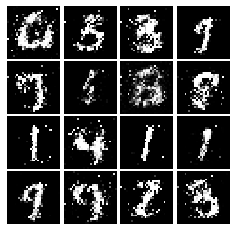

Epoch: 4, Iter: 2140, D: 0.2363, G:0.1658


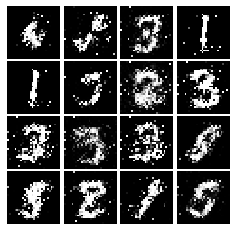

Epoch: 4, Iter: 2160, D: 0.246, G:0.1576


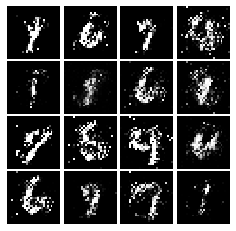

Epoch: 4, Iter: 2180, D: 0.2358, G:0.1596


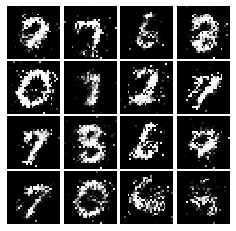

Epoch: 4, Iter: 2200, D: 0.2429, G:0.1628


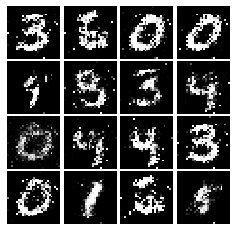

Epoch: 4, Iter: 2220, D: 0.2346, G:0.1722


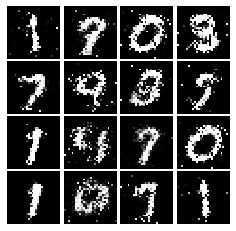

Epoch: 4, Iter: 2240, D: 0.2286, G:0.1462


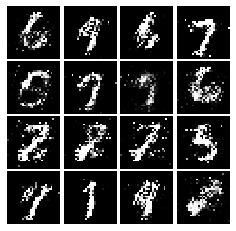

Epoch: 4, Iter: 2260, D: 0.2192, G:0.2125


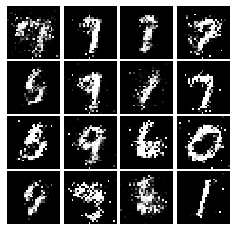

Epoch: 4, Iter: 2280, D: 0.224, G:0.2052


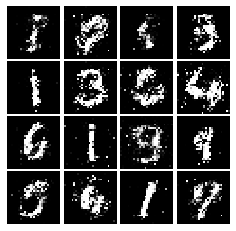

Epoch: 4, Iter: 2300, D: 0.2273, G:0.1934


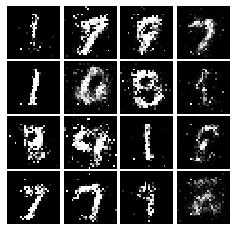

Epoch: 4, Iter: 2320, D: 0.1866, G:0.1776


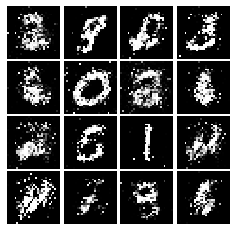

Epoch: 4, Iter: 2340, D: 0.1976, G:0.1937


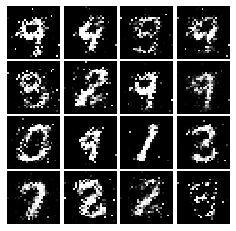

Epoch: 5, Iter: 2360, D: 0.2259, G:0.1578


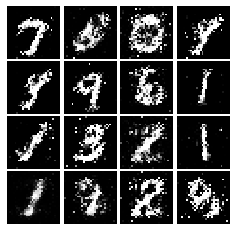

Epoch: 5, Iter: 2380, D: 0.2086, G:0.1754


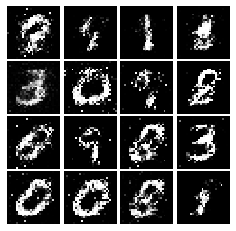

Epoch: 5, Iter: 2400, D: 0.2049, G:0.1895


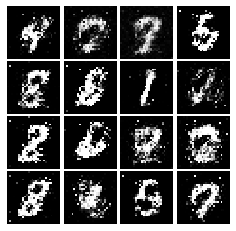

Epoch: 5, Iter: 2420, D: 0.2257, G:0.1802


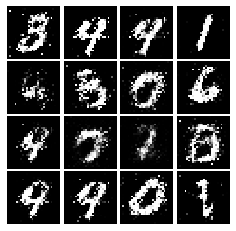

Epoch: 5, Iter: 2440, D: 0.2219, G:0.1808


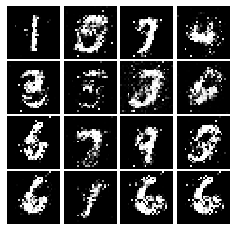

Epoch: 5, Iter: 2460, D: 0.1981, G:0.2195


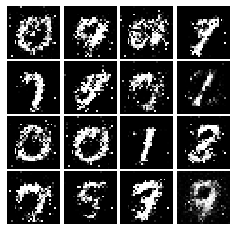

Epoch: 5, Iter: 2480, D: 0.2057, G:0.1938


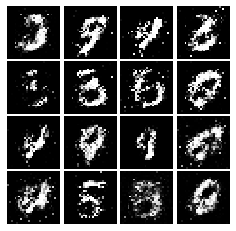

Epoch: 5, Iter: 2500, D: 0.1967, G:0.1919


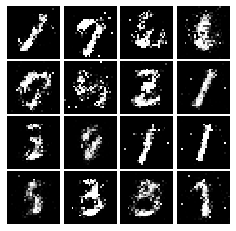

Epoch: 5, Iter: 2520, D: 0.2162, G:0.1559


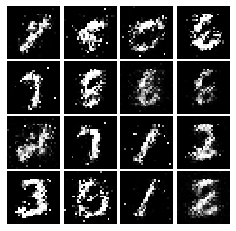

Epoch: 5, Iter: 2540, D: 0.2279, G:0.1635


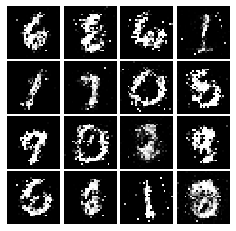

Epoch: 5, Iter: 2560, D: 0.239, G:0.1747


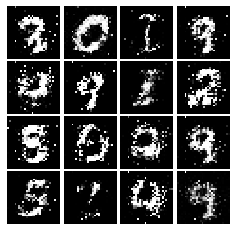

Epoch: 5, Iter: 2580, D: 0.2091, G:0.217


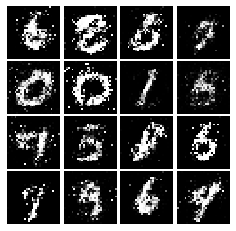

Epoch: 5, Iter: 2600, D: 0.2432, G:0.1547


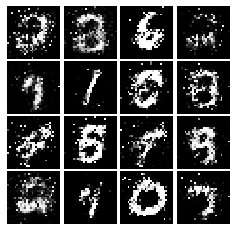

Epoch: 5, Iter: 2620, D: 0.2338, G:0.1766


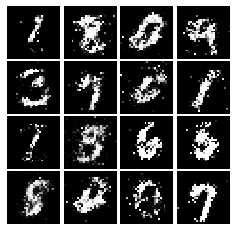

Epoch: 5, Iter: 2640, D: 0.2314, G:0.2265


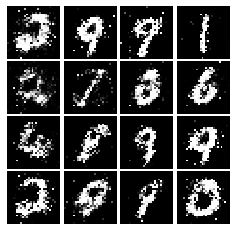

Epoch: 5, Iter: 2660, D: 0.2341, G:0.1679


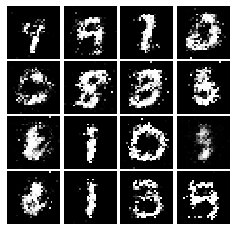

Epoch: 5, Iter: 2680, D: 0.2417, G:0.178


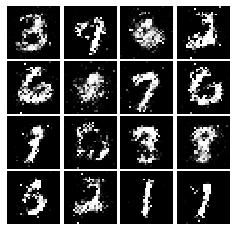

Epoch: 5, Iter: 2700, D: 0.2316, G:0.1668


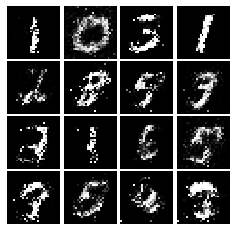

Epoch: 5, Iter: 2720, D: 0.2156, G:0.168


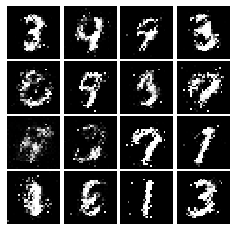

Epoch: 5, Iter: 2740, D: 0.2493, G:0.1671


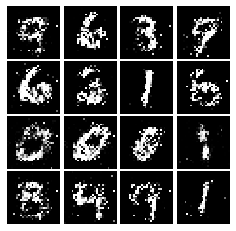

Epoch: 5, Iter: 2760, D: 0.234, G:0.1664


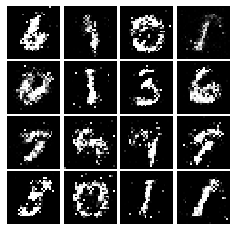

Epoch: 5, Iter: 2780, D: 0.2236, G:0.1592


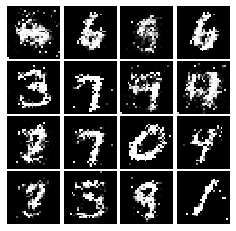

Epoch: 5, Iter: 2800, D: 0.186, G:0.1851


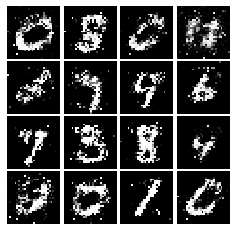

Epoch: 6, Iter: 2820, D: 0.2141, G:0.1645


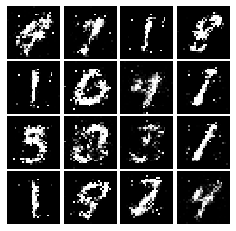

Epoch: 6, Iter: 2840, D: 0.2545, G:0.1806


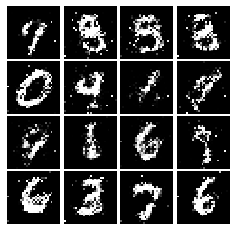

Epoch: 6, Iter: 2860, D: 0.2142, G:0.1778


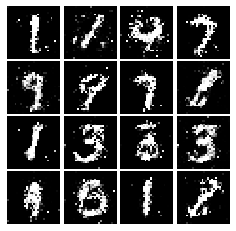

Epoch: 6, Iter: 2880, D: 0.214, G:0.2344


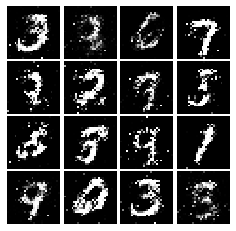

Epoch: 6, Iter: 2900, D: 0.2231, G:0.1716


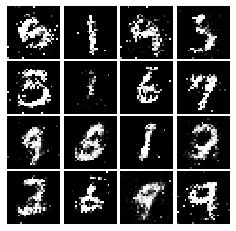

Epoch: 6, Iter: 2920, D: 0.2543, G:0.1656


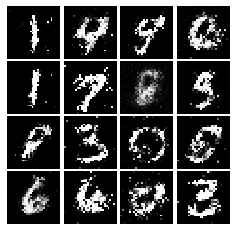

Epoch: 6, Iter: 2940, D: 0.2251, G:0.1717


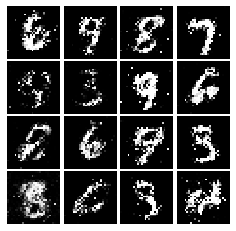

Epoch: 6, Iter: 2960, D: 0.2469, G:0.1828


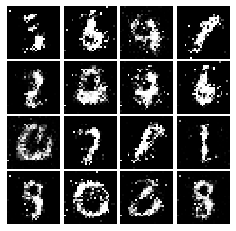

Epoch: 6, Iter: 2980, D: 0.2568, G:0.1656


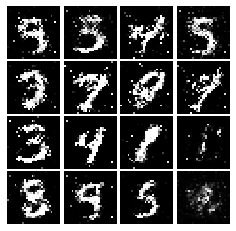

Epoch: 6, Iter: 3000, D: 0.2235, G:0.181


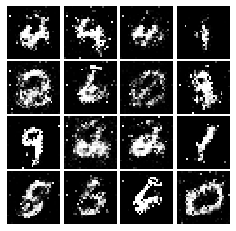

Epoch: 6, Iter: 3020, D: 0.2375, G:0.1819


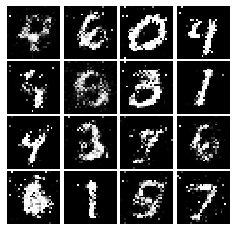

Epoch: 6, Iter: 3040, D: 0.2381, G:0.1966


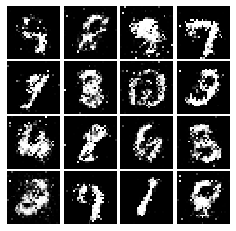

Epoch: 6, Iter: 3060, D: 0.234, G:0.1415


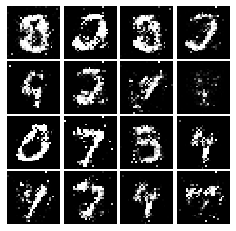

Epoch: 6, Iter: 3080, D: 0.2533, G:0.1659


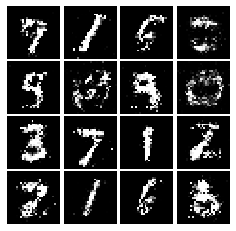

Epoch: 6, Iter: 3100, D: 0.2417, G:0.1705


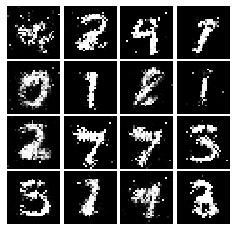

Epoch: 6, Iter: 3120, D: 0.2312, G:0.1671


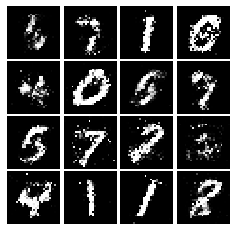

Epoch: 6, Iter: 3140, D: 0.2339, G:0.1638


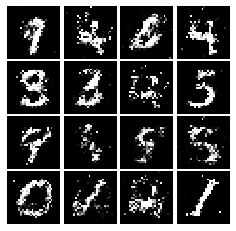

Epoch: 6, Iter: 3160, D: 0.2296, G:0.162


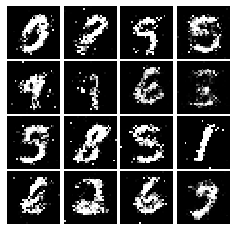

Epoch: 6, Iter: 3180, D: 0.211, G:0.1522


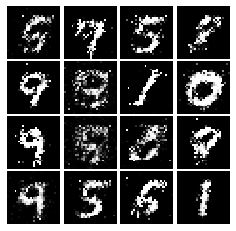

Epoch: 6, Iter: 3200, D: 0.2404, G:0.175


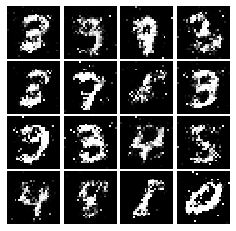

Epoch: 6, Iter: 3220, D: 0.2391, G:0.1878


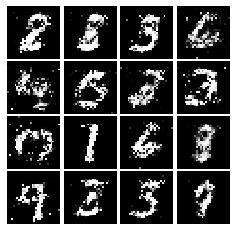

Epoch: 6, Iter: 3240, D: 0.207, G:0.1921


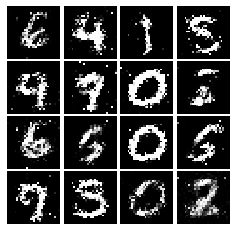

Epoch: 6, Iter: 3260, D: 0.2614, G:0.1854


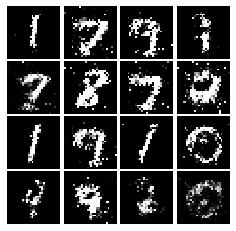

Epoch: 6, Iter: 3280, D: 0.2403, G:0.1908


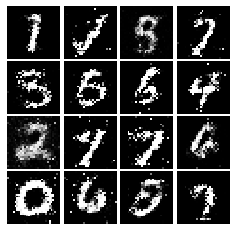

Epoch: 7, Iter: 3300, D: 0.2195, G:0.1744


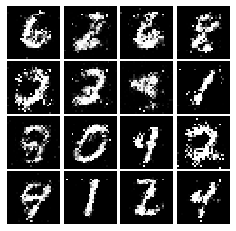

Epoch: 7, Iter: 3320, D: 0.2183, G:0.1791


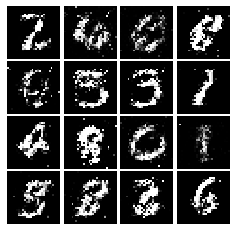

Epoch: 7, Iter: 3340, D: 0.2146, G:0.2121


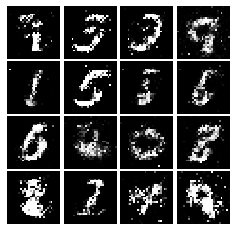

Epoch: 7, Iter: 3360, D: 0.2355, G:0.1948


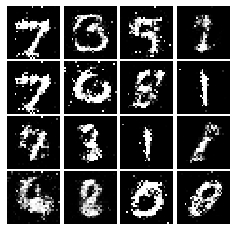

Epoch: 7, Iter: 3380, D: 0.2459, G:0.1619


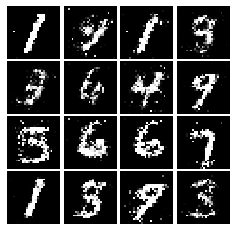

Epoch: 7, Iter: 3400, D: 0.2504, G:0.1785


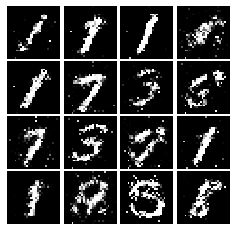

Epoch: 7, Iter: 3420, D: 0.2662, G:0.1569


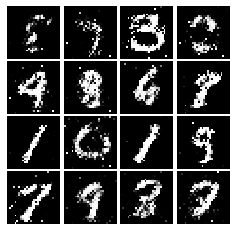

Epoch: 7, Iter: 3440, D: 0.2457, G:0.1868


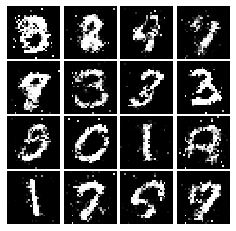

Epoch: 7, Iter: 3460, D: 0.2256, G:0.1851


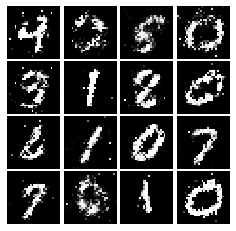

Epoch: 7, Iter: 3480, D: 0.2315, G:0.1529


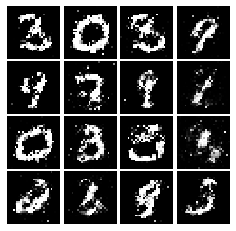

Epoch: 7, Iter: 3500, D: 0.233, G:0.1861


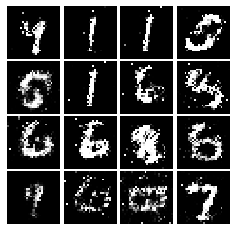

Epoch: 7, Iter: 3520, D: 0.2344, G:0.164


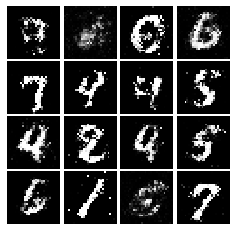

Epoch: 7, Iter: 3540, D: 0.2284, G:0.1847


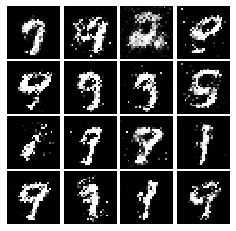

Epoch: 7, Iter: 3560, D: 0.2151, G:0.2007


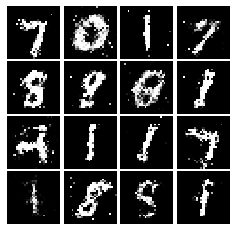

Epoch: 7, Iter: 3580, D: 0.2253, G:0.1746


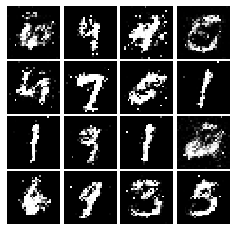

Epoch: 7, Iter: 3600, D: 0.2402, G:0.1731


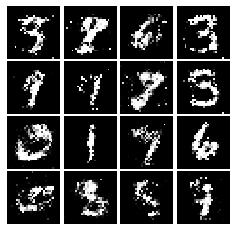

Epoch: 7, Iter: 3620, D: 0.2251, G:0.1531


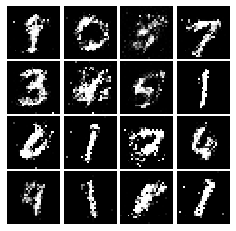

Epoch: 7, Iter: 3640, D: 0.2522, G:0.1489


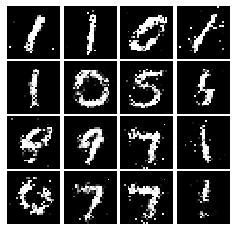

Epoch: 7, Iter: 3660, D: 0.2296, G:0.1484


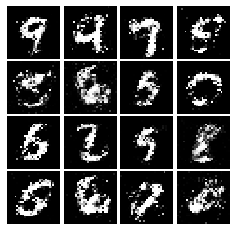

Epoch: 7, Iter: 3680, D: 0.2349, G:0.1554


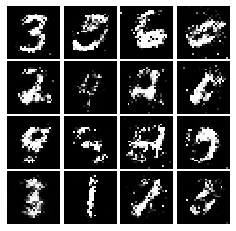

Epoch: 7, Iter: 3700, D: 0.2323, G:0.1662


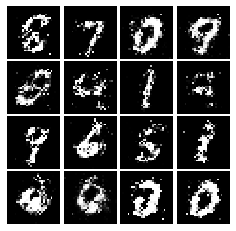

Epoch: 7, Iter: 3720, D: 0.2317, G:0.1526


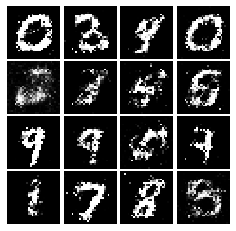

Epoch: 7, Iter: 3740, D: 0.2937, G:0.1041


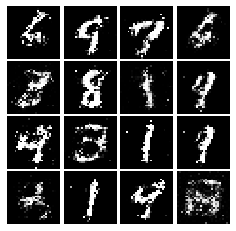

Epoch: 8, Iter: 3760, D: 0.2239, G:0.1888


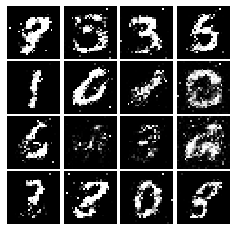

Epoch: 8, Iter: 3780, D: 0.2396, G:0.1516


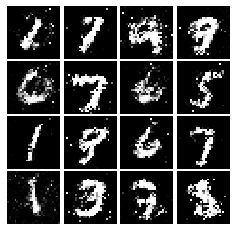

Epoch: 8, Iter: 3800, D: 0.2337, G:0.168


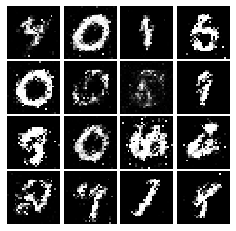

Epoch: 8, Iter: 3820, D: 0.2348, G:0.1449


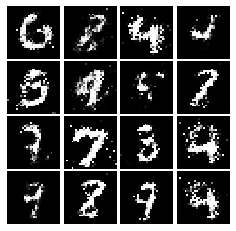

Epoch: 8, Iter: 3840, D: 0.2504, G:0.1561


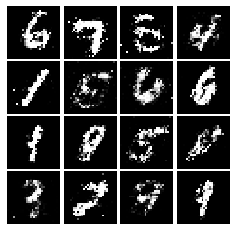

Epoch: 8, Iter: 3860, D: 0.2222, G:0.1504


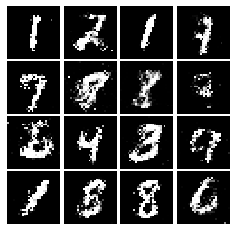

Epoch: 8, Iter: 3880, D: 0.2196, G:0.1661


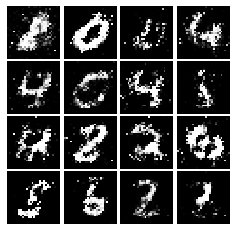

Epoch: 8, Iter: 3900, D: 0.2365, G:0.1532


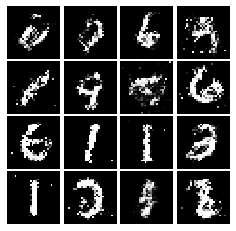

Epoch: 8, Iter: 3920, D: 0.24, G:0.1768


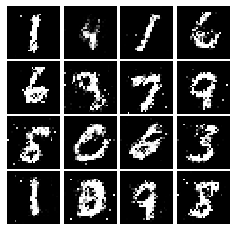

Epoch: 8, Iter: 3940, D: 0.245, G:0.1386


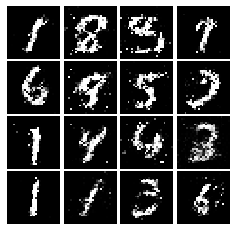

Epoch: 8, Iter: 3960, D: 0.2362, G:0.1663


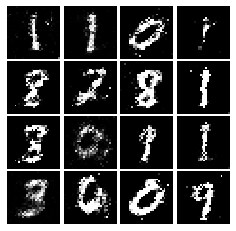

Epoch: 8, Iter: 3980, D: 0.2424, G:0.1838


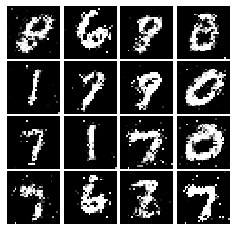

Epoch: 8, Iter: 4000, D: 0.2157, G:0.1727


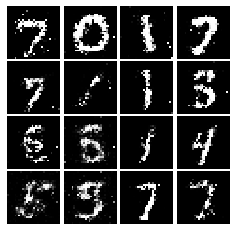

Epoch: 8, Iter: 4020, D: 0.2268, G:0.1594


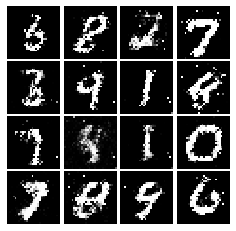

Epoch: 8, Iter: 4040, D: 0.2276, G:0.164


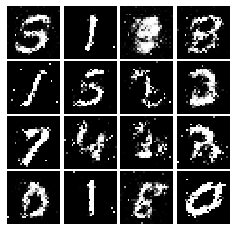

Epoch: 8, Iter: 4060, D: 0.2258, G:0.155


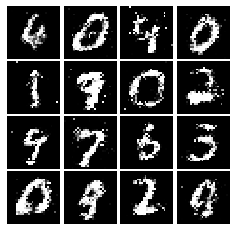

Epoch: 8, Iter: 4080, D: 0.2548, G:0.1547


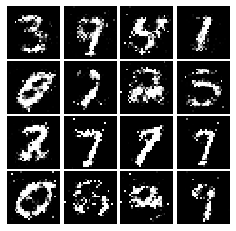

Epoch: 8, Iter: 4100, D: 0.2361, G:0.1556


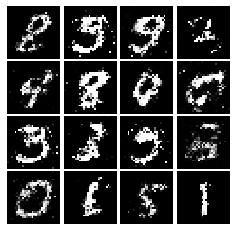

Epoch: 8, Iter: 4120, D: 0.2349, G:0.1647


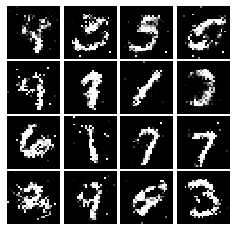

Epoch: 8, Iter: 4140, D: 0.2587, G:0.1702


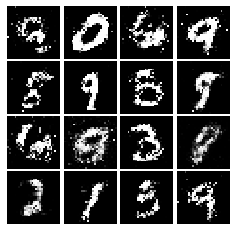

Epoch: 8, Iter: 4160, D: 0.2353, G:0.1692


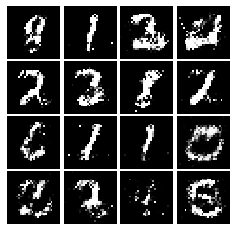

Epoch: 8, Iter: 4180, D: 0.2494, G:0.145


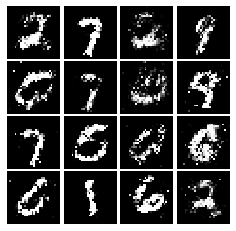

Epoch: 8, Iter: 4200, D: 0.2429, G:0.159


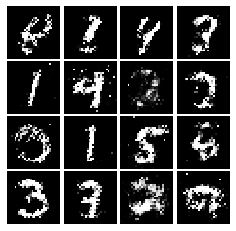

Epoch: 8, Iter: 4220, D: 0.212, G:0.189


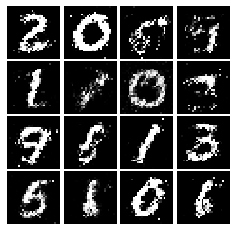

Epoch: 9, Iter: 4240, D: 0.2551, G:0.156


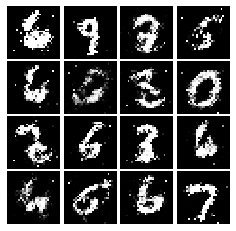

Epoch: 9, Iter: 4260, D: 0.2506, G:0.1355


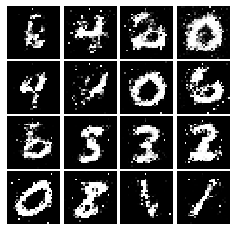

Epoch: 9, Iter: 4280, D: 0.2257, G:0.166


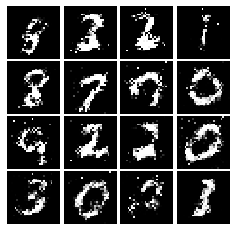

Epoch: 9, Iter: 4300, D: 0.2539, G:0.1753


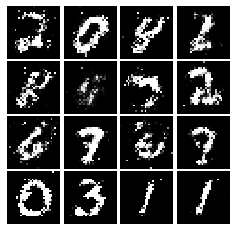

Epoch: 9, Iter: 4320, D: 0.2387, G:0.1541


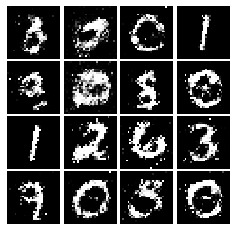

Epoch: 9, Iter: 4340, D: 0.2406, G:0.1583


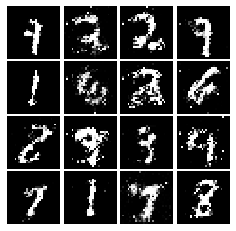

Epoch: 9, Iter: 4360, D: 0.2449, G:0.1747


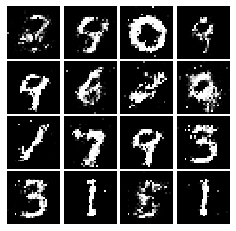

Epoch: 9, Iter: 4380, D: 0.2716, G:0.167


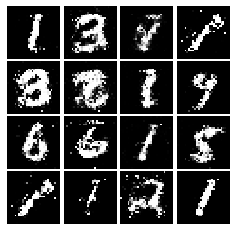

Epoch: 9, Iter: 4400, D: 0.2061, G:0.1811


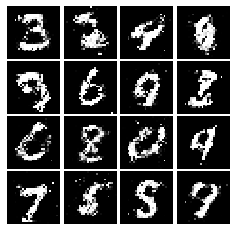

Epoch: 9, Iter: 4420, D: 0.2238, G:0.1464


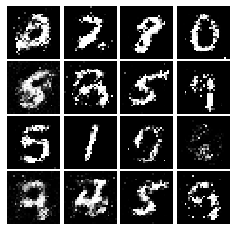

Epoch: 9, Iter: 4440, D: 0.2504, G:0.1903


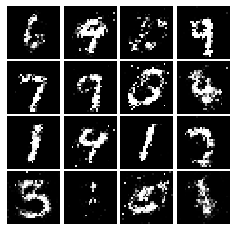

Epoch: 9, Iter: 4460, D: 0.2585, G:0.1327


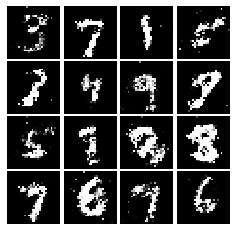

Epoch: 9, Iter: 4480, D: 0.2324, G:0.1688


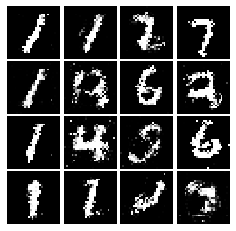

Epoch: 9, Iter: 4500, D: 0.2652, G:0.1521


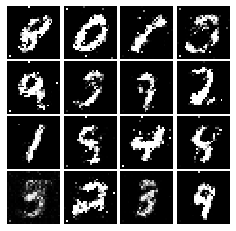

Epoch: 9, Iter: 4520, D: 0.2381, G:0.1567


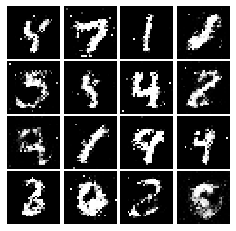

Epoch: 9, Iter: 4540, D: 0.2389, G:0.1525


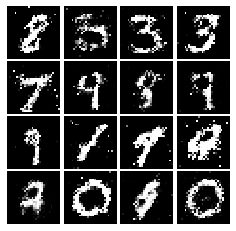

Epoch: 9, Iter: 4560, D: 0.2326, G:0.1637


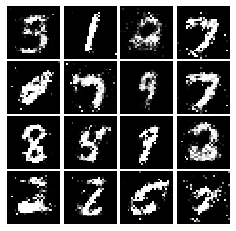

Epoch: 9, Iter: 4580, D: 0.2192, G:0.1522


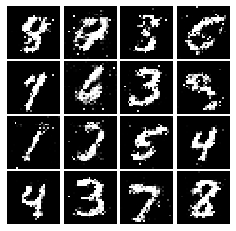

Epoch: 9, Iter: 4600, D: 0.2277, G:0.1591


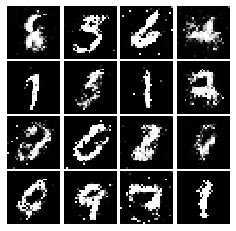

Epoch: 9, Iter: 4620, D: 0.2375, G:0.1644


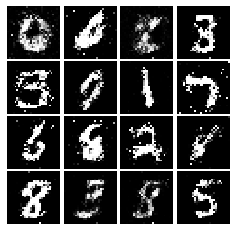

Epoch: 9, Iter: 4640, D: 0.2241, G:0.1713


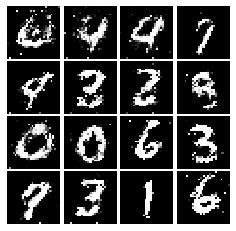

Epoch: 9, Iter: 4660, D: 0.233, G:0.161


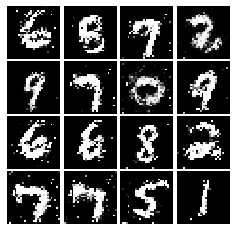

Epoch: 9, Iter: 4680, D: 0.2393, G:0.153


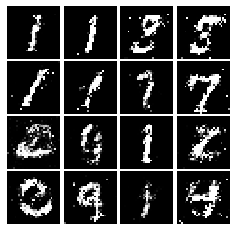

Final images


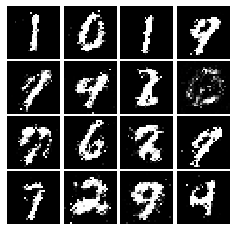

In [147]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [161]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        #pass
        tf.keras.layers.InputLayer((784,)),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32,5,[1,1],padding='VALID',activation=leaky_relu),
        tf.keras.layers.MaxPooling2D((2, 2),[2,2],padding='VALID'),
        tf.keras.layers.Conv2D(64,5,[1,1],padding='VALID',activation=leaky_relu),
        tf.keras.layers.MaxPooling2D((2, 2),[2,2],padding='VALID'),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64,activation=leaky_relu),
        tf.keras.layers.Dense(1)
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [163]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    pass
    layers = [
        tf.keras.layers.InputLayer((noise_dim,)),
        tf.keras.layers.Dense(1024,activation='relu'),
        tf.keras.layers.BatchNormalization(),

        tf.keras.layers.Dense(7*7*128,activation='relu'),
        tf.keras.layers.BatchNormalization(),
        
        tf.keras.layers.Reshape((7,7,128)),
        tf.keras.layers.Conv2DTranspose(64,[4,4],[2,2],padding='same',activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(1,[4,4],[2,2],padding='same',activation='tanh'),
    ]
    
    model = tf.keras.Sequential(layers)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

TypeError: ('Keyword argument not understood:', 'training')

We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.41, G:0.659


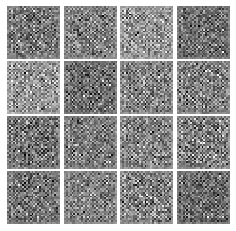

Epoch: 0, Iter: 20, D: 0.3175, G:1.535


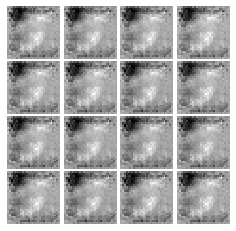

Epoch: 0, Iter: 40, D: 0.01387, G:4.377


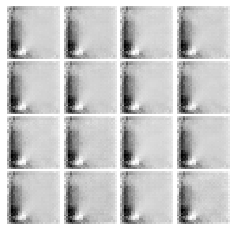

Epoch: 0, Iter: 60, D: 0.004197, G:5.55


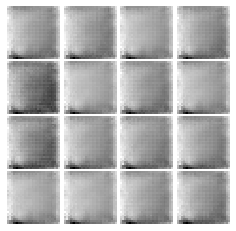

Epoch: 0, Iter: 80, D: 0.001324, G:6.677


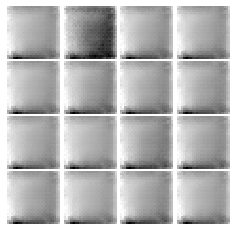

Epoch: 0, Iter: 100, D: 0.0009678, G:7.32


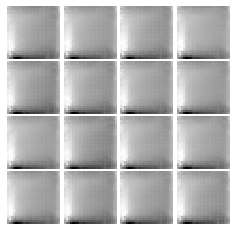

Epoch: 0, Iter: 120, D: 0.002053, G:6.402


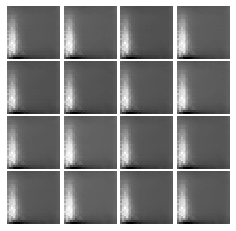

Epoch: 0, Iter: 140, D: 0.09596, G:4.545


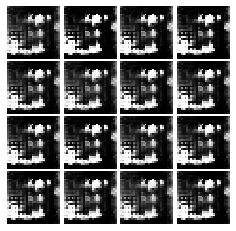

Epoch: 0, Iter: 160, D: 0.09927, G:2.809


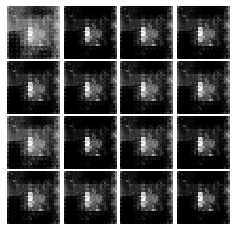

Epoch: 0, Iter: 180, D: 0.02635, G:4.203


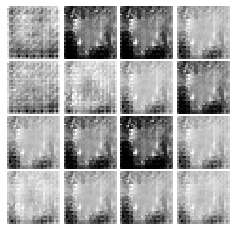

Epoch: 0, Iter: 200, D: 0.9752, G:1.427


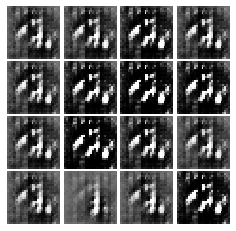

Epoch: 0, Iter: 220, D: 0.9401, G:3.502


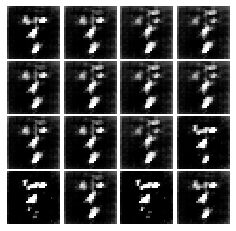

Epoch: 0, Iter: 240, D: 1.083, G:3.599


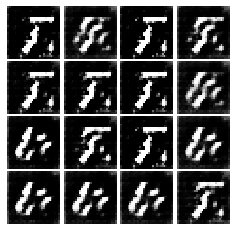

Epoch: 0, Iter: 260, D: 0.7544, G:2.777


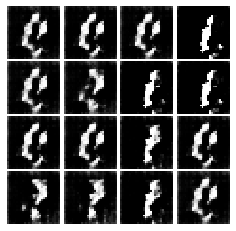

Epoch: 0, Iter: 280, D: 0.4071, G:2.202


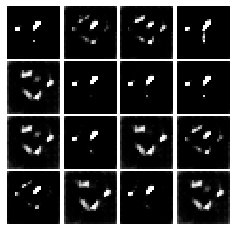

Epoch: 0, Iter: 300, D: 0.6465, G:2.417


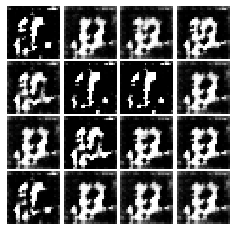

Epoch: 0, Iter: 320, D: 1.346, G:1.53


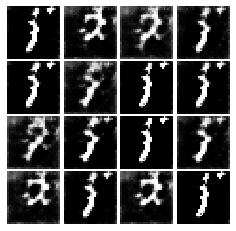

Epoch: 0, Iter: 340, D: 0.7042, G:2.45


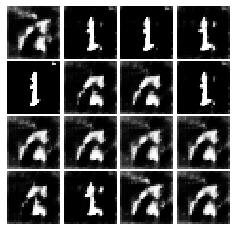

Epoch: 0, Iter: 360, D: 0.6475, G:3.055


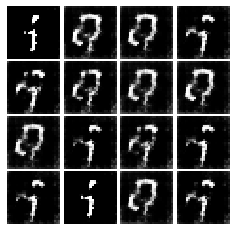

Epoch: 0, Iter: 380, D: 0.7774, G:2.082


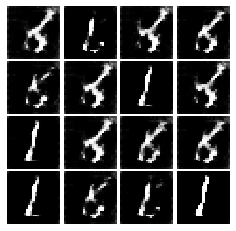

Epoch: 0, Iter: 400, D: 0.4277, G:2.885


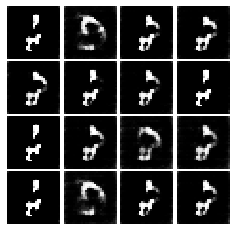

Epoch: 0, Iter: 420, D: 0.2649, G:3.444


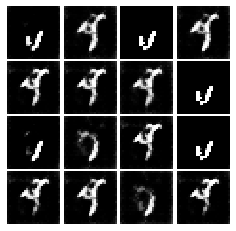

Epoch: 0, Iter: 440, D: 0.5526, G:3.21


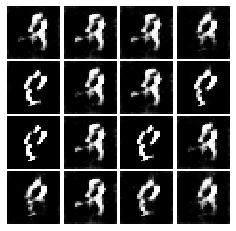

Epoch: 0, Iter: 460, D: 0.07125, G:4.251


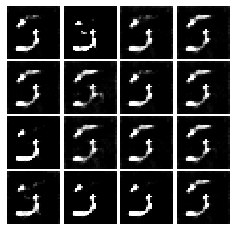

Epoch: 1, Iter: 480, D: 0.7495, G:3.016


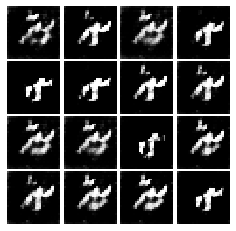

Epoch: 1, Iter: 500, D: 1.072, G:4.966


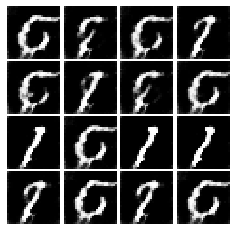

Epoch: 1, Iter: 520, D: 0.1496, G:3.836


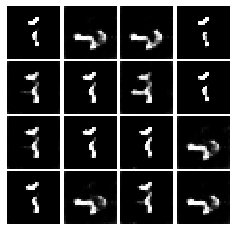

Epoch: 1, Iter: 540, D: 0.5401, G:3.26


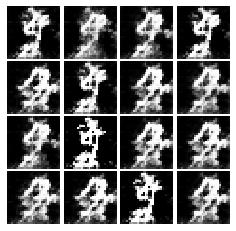

Epoch: 1, Iter: 560, D: 0.5253, G:2.822


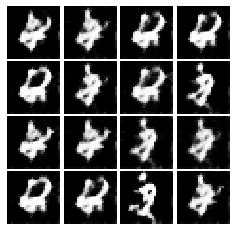

Epoch: 1, Iter: 580, D: 0.6929, G:2.682


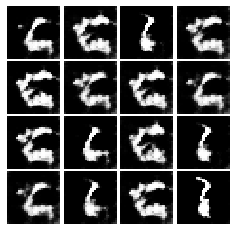

Epoch: 1, Iter: 600, D: 0.6326, G:3.174


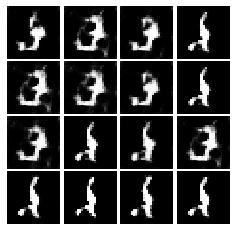

Epoch: 1, Iter: 620, D: 0.6807, G:3.709


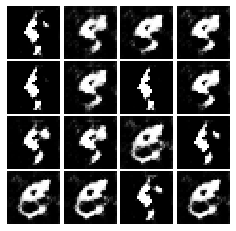

Epoch: 1, Iter: 640, D: 1.091, G:0.6297


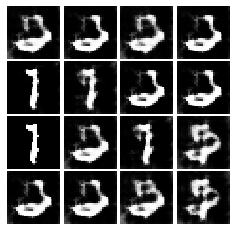

Epoch: 1, Iter: 660, D: 0.3983, G:2.354


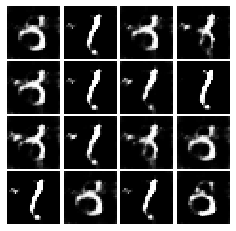

Epoch: 1, Iter: 680, D: 0.3836, G:2.916


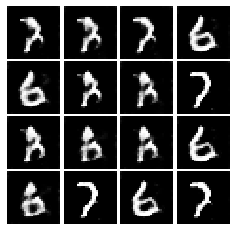

Epoch: 1, Iter: 700, D: 1.014, G:6.426


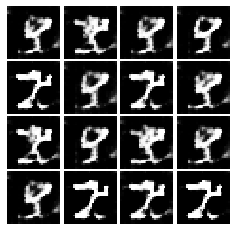

Epoch: 1, Iter: 720, D: 0.3019, G:3.861


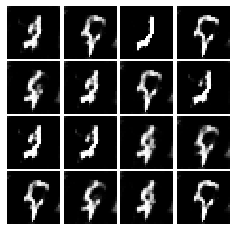

Epoch: 1, Iter: 740, D: 0.45, G:2.943


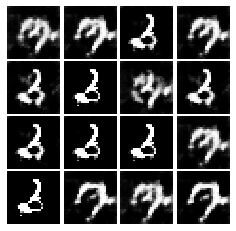

Epoch: 1, Iter: 760, D: 0.2699, G:3.576


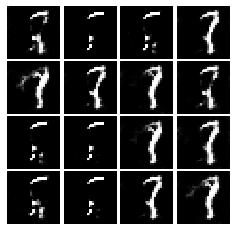

Epoch: 1, Iter: 780, D: 0.3495, G:3.767


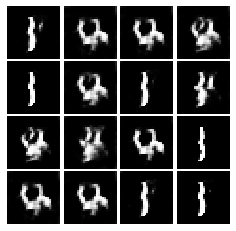

Epoch: 1, Iter: 800, D: 0.3699, G:2.511


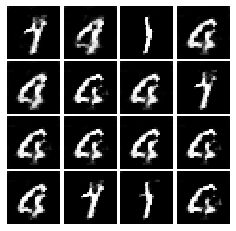

Epoch: 1, Iter: 820, D: 0.43, G:2.055


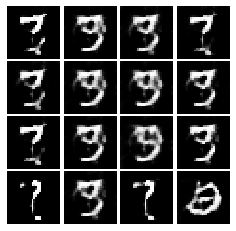

Epoch: 1, Iter: 840, D: 0.7696, G:3.018


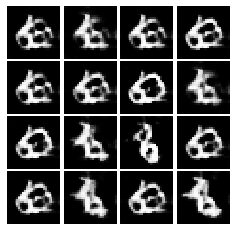

Epoch: 1, Iter: 860, D: 0.5518, G:5.978


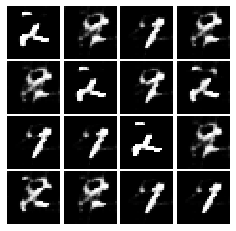

Epoch: 1, Iter: 880, D: 1.21, G:4.355


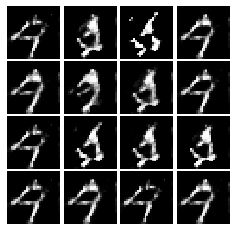

Epoch: 1, Iter: 900, D: 0.4118, G:4.14


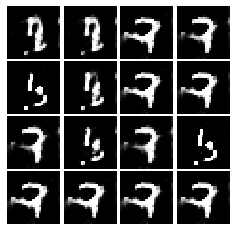

Epoch: 1, Iter: 920, D: 0.4434, G:3.986


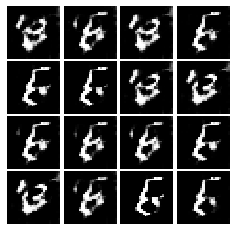

Epoch: 2, Iter: 940, D: 0.2318, G:4.688


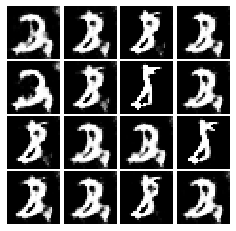

Epoch: 2, Iter: 960, D: 0.2288, G:3.716


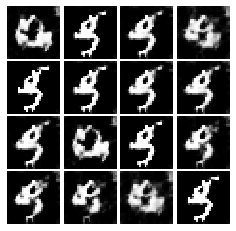

Epoch: 2, Iter: 980, D: 1.141, G:8.465


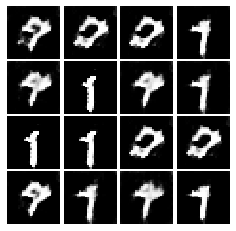

Epoch: 2, Iter: 1000, D: 0.614, G:2.019


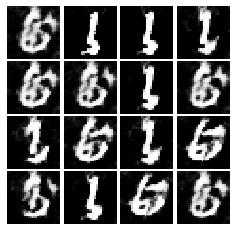

Epoch: 2, Iter: 1020, D: 0.352, G:2.353


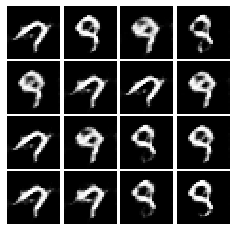

Epoch: 2, Iter: 1040, D: 0.3259, G:2.625


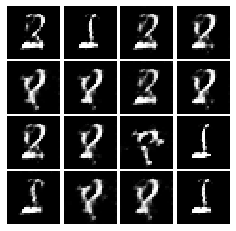

Epoch: 2, Iter: 1060, D: 0.309, G:3.401


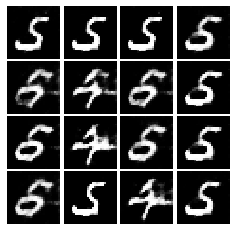

Epoch: 2, Iter: 1080, D: 0.274, G:4.366


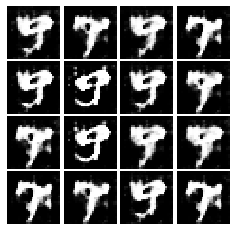

Epoch: 2, Iter: 1100, D: 0.3087, G:3.124


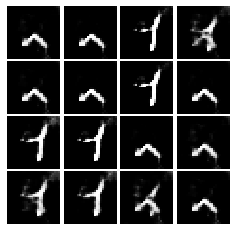

Epoch: 2, Iter: 1120, D: 1.741, G:7.065


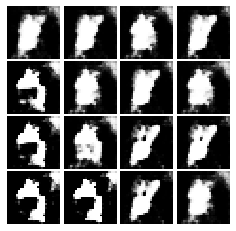

Epoch: 2, Iter: 1140, D: 0.4621, G:3.618


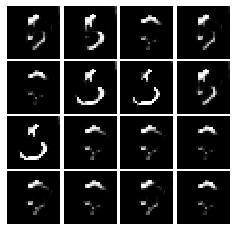

Epoch: 2, Iter: 1160, D: 2.259, G:13.68


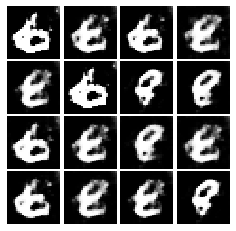

Epoch: 2, Iter: 1180, D: 0.08914, G:3.786


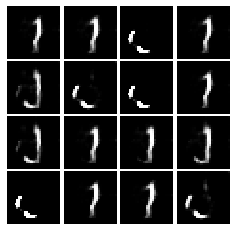

Epoch: 2, Iter: 1200, D: 0.6751, G:5.394


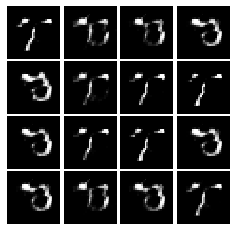

Epoch: 2, Iter: 1220, D: 0.8403, G:9.355


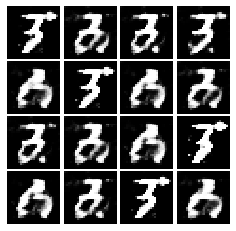

Epoch: 2, Iter: 1240, D: 0.3651, G:3.5


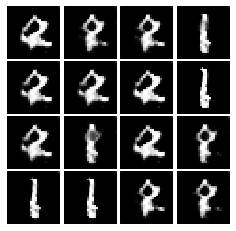

Epoch: 2, Iter: 1260, D: 0.7217, G:2.679


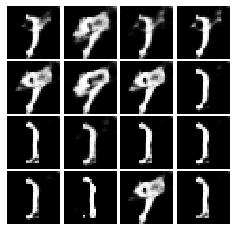

Epoch: 2, Iter: 1280, D: 0.5953, G:4.89


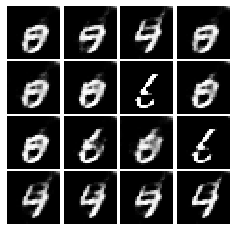

Epoch: 2, Iter: 1300, D: 0.543, G:3.712


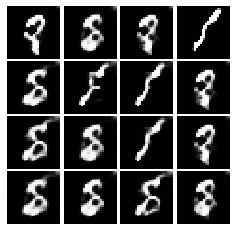

Epoch: 2, Iter: 1320, D: 0.3486, G:3.699


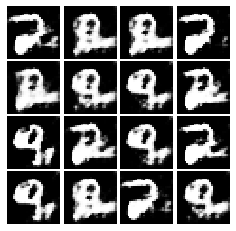

Epoch: 2, Iter: 1340, D: 0.6641, G:3.116


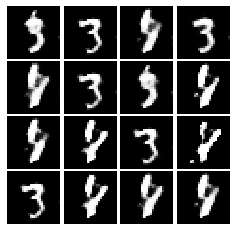

Epoch: 2, Iter: 1360, D: 0.6575, G:6.724


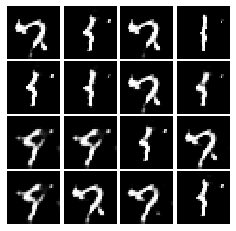

Epoch: 2, Iter: 1380, D: 0.342, G:3.588


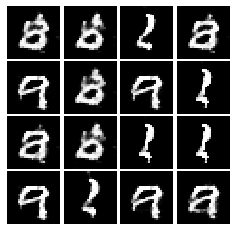

Epoch: 2, Iter: 1400, D: 0.4483, G:3.376


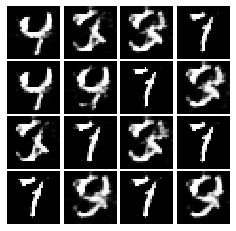

Epoch: 3, Iter: 1420, D: 0.1387, G:2.805


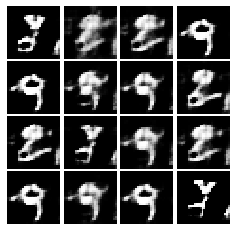

Epoch: 3, Iter: 1440, D: 0.4603, G:2.488


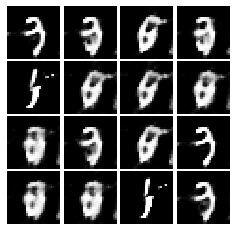

Epoch: 3, Iter: 1460, D: 0.4272, G:4.43


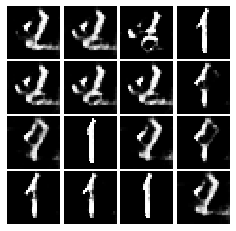

Epoch: 3, Iter: 1480, D: 0.6038, G:9.154


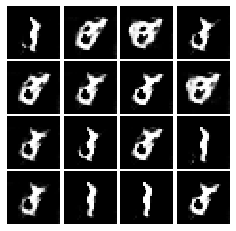

Epoch: 3, Iter: 1500, D: 0.3455, G:5.048


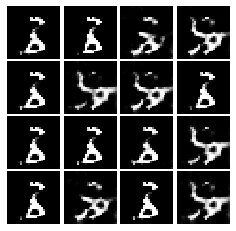

Epoch: 3, Iter: 1520, D: 0.1661, G:4.584


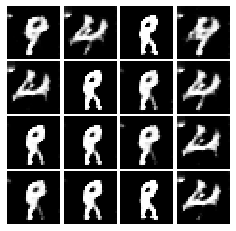

Epoch: 3, Iter: 1540, D: 0.3266, G:3.929


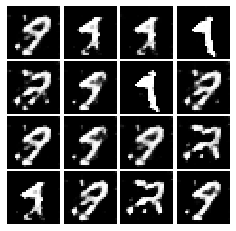

Epoch: 3, Iter: 1560, D: 1.186, G:3.981


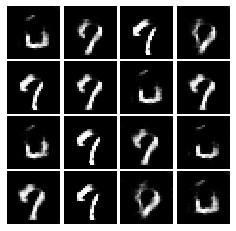

Epoch: 3, Iter: 1580, D: 0.2402, G:2.675


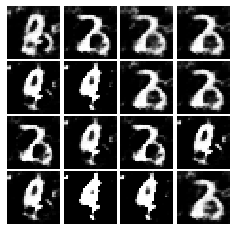

Epoch: 3, Iter: 1600, D: 0.5532, G:1.43


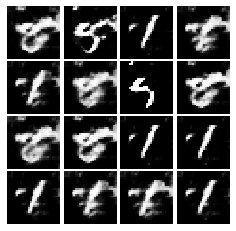

Epoch: 3, Iter: 1620, D: 0.2747, G:3.763


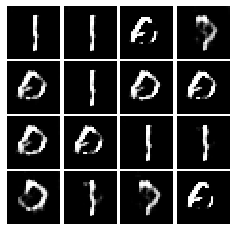

Epoch: 3, Iter: 1640, D: 0.3107, G:5.296


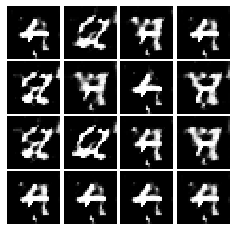

Epoch: 3, Iter: 1660, D: 0.5687, G:11.66


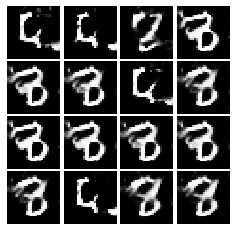

Epoch: 3, Iter: 1680, D: 0.2147, G:4.29


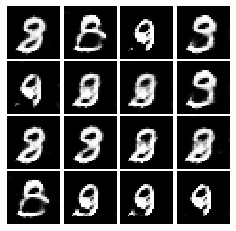

Epoch: 3, Iter: 1700, D: 0.4663, G:3.285


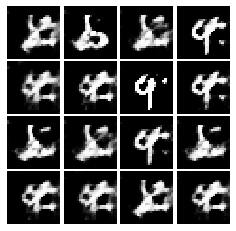

Epoch: 3, Iter: 1720, D: 0.3871, G:3.237


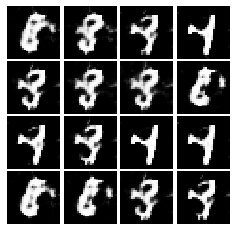

Epoch: 3, Iter: 1740, D: 0.5311, G:2.764


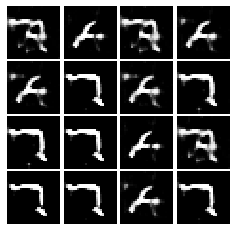

Epoch: 3, Iter: 1760, D: 0.1217, G:5.23


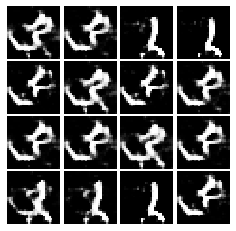

Epoch: 3, Iter: 1780, D: 0.2484, G:4.279


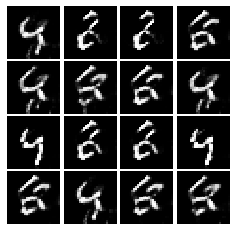

Epoch: 3, Iter: 1800, D: 0.7821, G:1.825


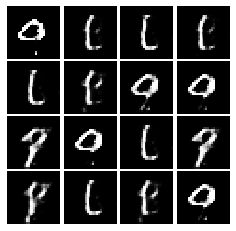

Epoch: 3, Iter: 1820, D: 0.2791, G:3.101


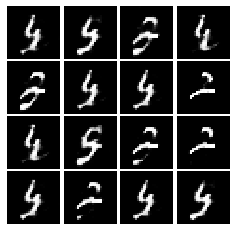

Epoch: 3, Iter: 1840, D: 0.2611, G:4.961


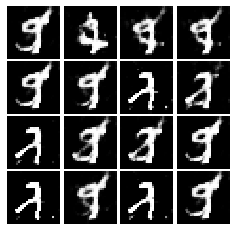

Epoch: 3, Iter: 1860, D: 0.4008, G:4.921


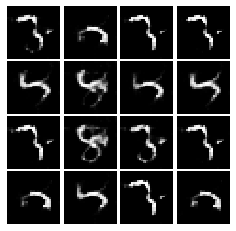

Epoch: 4, Iter: 1880, D: 0.2997, G:3.853


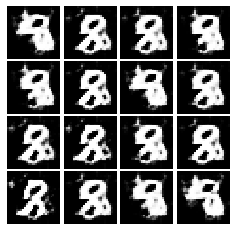

Epoch: 4, Iter: 1900, D: 0.1182, G:4.312


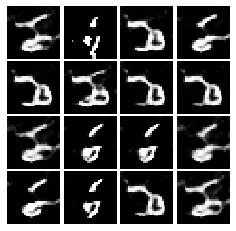

Epoch: 4, Iter: 1920, D: 0.2812, G:3.937


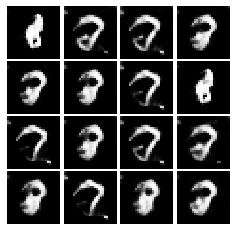

Epoch: 4, Iter: 1940, D: 0.4239, G:4.108


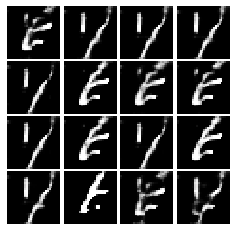

Epoch: 4, Iter: 1960, D: 0.2472, G:3.592


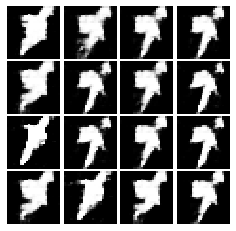

Epoch: 4, Iter: 1980, D: 0.05765, G:4.081


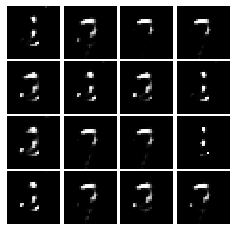

Epoch: 4, Iter: 2000, D: 0.6619, G:3.05


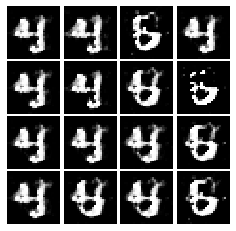

Epoch: 4, Iter: 2020, D: 0.4665, G:6.773


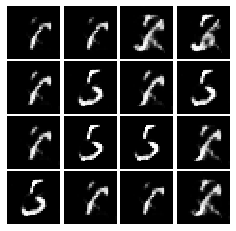

Epoch: 4, Iter: 2040, D: 0.277, G:4.399


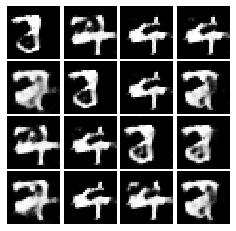

Epoch: 4, Iter: 2060, D: 0.303, G:3.659


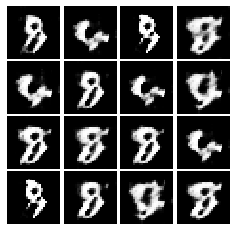

Epoch: 4, Iter: 2080, D: 0.3721, G:4.992


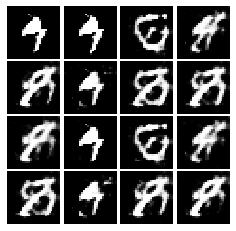

Epoch: 4, Iter: 2100, D: 0.07459, G:5.296


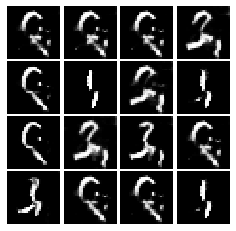

Epoch: 4, Iter: 2120, D: 0.3318, G:3.788


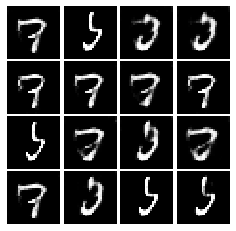

Epoch: 4, Iter: 2140, D: 0.7575, G:4.872


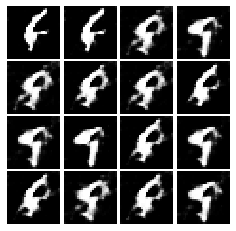

Epoch: 4, Iter: 2160, D: 0.5218, G:6.257


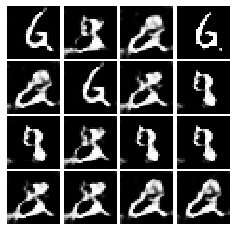

Epoch: 4, Iter: 2180, D: 0.172, G:3.423


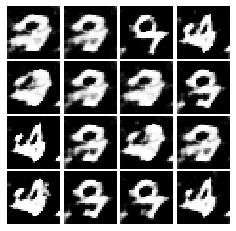

Epoch: 4, Iter: 2200, D: 0.2518, G:3.658


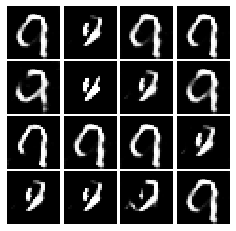

Epoch: 4, Iter: 2220, D: 0.2305, G:6.518


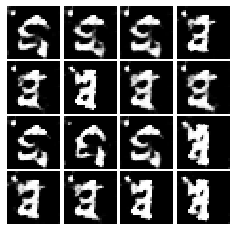

Epoch: 4, Iter: 2240, D: 0.1418, G:4.766


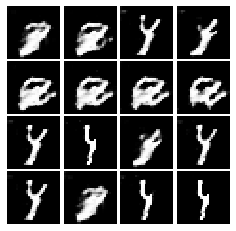

Epoch: 4, Iter: 2260, D: 0.4364, G:6.072


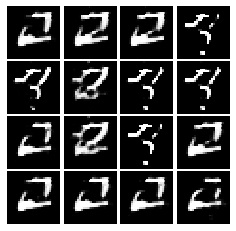

Epoch: 4, Iter: 2280, D: 0.2238, G:4.33


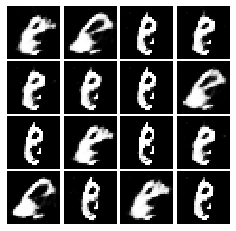

Epoch: 4, Iter: 2300, D: 0.2264, G:4.293


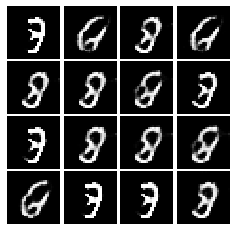

Epoch: 4, Iter: 2320, D: 0.2035, G:3.973


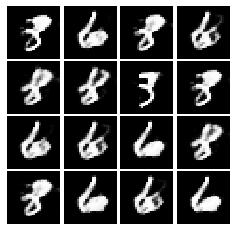

Epoch: 4, Iter: 2340, D: 0.1859, G:4.787


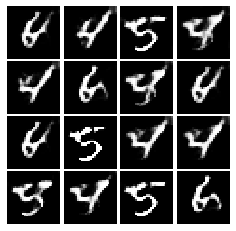

Final images


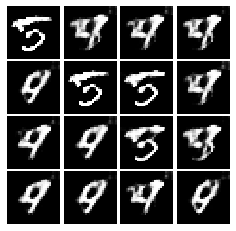

In [159]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
